In [ ]:
# Importing necessary libraries
import pandas as pd

unique_lat_long_with_url_cleaned = pd.read_csv('unique_lat_long_with_url_cleaned_aims.csv', low_memory=False)
unique_lat_long_with_url_cleaned.head()

,Date,Latitude_Degrees,Longitude_Degrees,URL
0,2005-09-13,-28.8645,114.0012,https://oceancolor.gsfc.nasa.gov/showimages/MO...
1,2016-04-19,-28.1625,153.5311,https://oceancolor.gsfc.nasa.gov/showimages/MO...
2,2007-10-01,-28.1092,153.4758,https://oceancolor.gsfc.nasa.gov/showimages/MO...
3,2008-08-03,-28.1092,153.4758,https://oceancolor.gsfc.nasa.gov/showimages/MO...
4,2009-09-20,-28.1092,153.4758,https://oceancolor.gsfc.nasa.gov/showimages/MO...


In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import gc  # Import garbage collection

# Step 1: Function to download and convert URL into image array
def url_to_image_array(url, size=(432,216)):  # Set a consistent size here
    try:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))

        # Convert the image to RGB if it is a palette-based image
        if img.mode == 'P':
            img = img.convert('RGB')

        img = img.resize(size, Image.Resampling.LANCZOS)  # Resize the image using LANCZOS (formerly ANTIALIAS)
        img_array = np.array(img)
        return img_array
    except Exception as e:
        print(f"Error loading image from {url}: {e}")
        return None

# Step 2: Function to extract RGB values from the image array
def extract_rgb_for_lat_lon(img_array, lat, lon, img_size=(432,216)):  # Update img_size to match resized dimensions
    if img_array is None:
        return None

    # Convert latitude and longitude to pixel coordinates based on new image size
    x = int((lat + 90) * (img_size[0] / 180))  # Map latitude to pixel x coordinate
    y = int((lon + 180) * (img_size[1] / 360))  # Map longitude to pixel y coordinate

    # Ensure x and y are within bounds
    x = max(0, min(x, img_size[0] - 1))  # Clamp x to [0, img_size[0]-1]
    y = max(0, min(y, img_size[1] - 1))  # Clamp y to [0, img_size[1]-1]

    try:
        rgb_value = img_array[y, x]  # Extract RGB values
        return rgb_value
    except IndexError as e:
        print(f"IndexError for Latitude: {lat}, Longitude: {lon} with calculated x: {x}, y: {y}")
        return None

# Step 3: Iterate through the unique_lat_long DataFrame in batches
batch_size = 100  # Define the batch size
rgb_values = []  # List to store RGB values for each entry

# Initialize the CSV file and write the header
unique_lat_long_with_url_cleaned.head(0).to_csv('unique_lat_long_with_rgb_aims.csv', index=False)

for i in range(0, len(unique_lat_long_with_url_cleaned), batch_size):
    # Select a batch of rows
    batch = unique_lat_long_with_url_cleaned.iloc[i:i+batch_size]

    # Process each row in the batch
    batch_rgb_values = []
    for index, row in batch.iterrows():
        test_url = row['URL']
        latitude = row['Latitude_Degrees']
        longitude = row['Longitude_Degrees']

        # Download the image with resizing
        img_array = url_to_image_array(test_url)

        # Get the RGB values from the image
        rgb_value = extract_rgb_for_lat_lon(img_array, latitude, longitude, img_size=(432,216))

        # Append the RGB value to the batch list
        batch_rgb_values.append(rgb_value)

        # Clean up memory
        del img_array
        gc.collect()  # Explicit garbage collection

    # Add the RGB values to the batch DataFrame
    batch['RGB'] = batch_rgb_values

    # Append the batch to the CSV file
    batch.to_csv('unique_lat_long_with_rgb_aims.csv', mode='a', header=False, index=False)

    # Print progress after processing the batch
    print(f"Processed {i+batch_size} rows, intermediate results saved.")

# Output the final status
print("All batches processed and saved to 'unique_lat_long_with_rgb_aims.csv'.")


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 1900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 2900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 3900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 4900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 5900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 6900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 7900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 8900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 9900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 10900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 11900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 12900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 13900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 14900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 15900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 16900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17800 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 17900 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18000 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18100 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18200 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18300 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18400 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18500 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18600 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18700 rows, intermediate results saved.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


Processed 18800 rows, intermediate results saved.
Processed 18900 rows, intermediate results saved.
All batches processed and saved to 'unique_lat_long_with_rgb_aims.csv'.


<ipython-input-4-714f7e674269>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  batch['RGB'] = batch_rgb_values


In [ ]:
# Importing necessary libraries
import pandas as pd

unique_lat_long_with_rgb = pd.read_csv('unique_lat_long_with_rgb_aims.csv')
unique_lat_long_with_rgb

,Date,Latitude_Degrees,Longitude_Degrees,URL
2005-09-13,-28.864500,114.001200,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2016-04-19,-28.162500,153.531100,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2007-10-01,-28.109200,153.475800,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2008-08-03,-28.109200,153.475800,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2009-09-20,-28.109200,153.475800,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
...,...,...,...,...
2016-06-07,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2017-09-04,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2018-07-28,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2019-08-08,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]


In [ ]:
# Reset the index to make 'Date' a regular column
unique_lat_long_with_rgb = unique_lat_long_with_rgb.reset_index()

# Verify if 'Date' is now a column and not the index
unique_lat_long_with_rgb.head()

unique_lat_long_with_rgb.columns = ['Date', 'Latitude_Degrees', 'Longitude_Degrees', 'Image_URL', 'RGB']
unique_lat_long_with_rgb

,Date,Latitude_Degrees,Longitude_Degrees,Image_URL,RGB
0,2005-09-13,-28.864500,114.001200,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
1,2016-04-19,-28.162500,153.531100,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
2,2007-10-01,-28.109200,153.475800,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
3,2008-08-03,-28.109200,153.475800,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
4,2009-09-20,-28.109200,153.475800,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
...,...,...,...,...,...
18875,2016-06-07,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
18876,2017-09-04,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
18877,2018-07-28,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
18878,2019-08-08,-16.291883,145.496517,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]


In [ ]:
coralsense_featureset_aims = pd.read_csv('coralsense_featureset_aims.csv', low_memory=False)
coralsense_featureset_aims.head(7)

,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Unnamed: 0,Site_ID,Sample_ID,Data_Source,Ocean_Name,Reef_ID,...,Soft Coral,REEF_NAME,REEF_ID,VISIT_NO,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,Other
0,-30.2625,30.8278,2001-07-21,12.0,39733.0,7907.0,10316839.0,Reef_Check,Indian,30.49.66E.30.15.75S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-30.2625,30.8278,2001-07-21,16.0,39735.0,7907.0,10316840.0,Reef_Check,Indian,30.49.66E.30.15.75S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-30.2622,30.8272,2000-10-06,11.0,39737.0,7908.0,10316838.0,Reef_Check,Indian,30.49.63E.30.15.73S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-29.8652,31.0540,2002-04-27,4.5,39739.0,7909.0,10316841.0,Reef_Check,Indian,31.3.241E.29.51.914S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-28.8645,114.0012,2005-09-13,11.0,26576.0,1029.0,10309610.0,Reef_Check,Indian,114.0.7E.28.51.87S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,-28.8631,34.4436,2000-12-08,16.0,39741.0,7910.0,10317006.0,Reef_Check,Indian,34.26.62E.28.51.79S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,-28.7161,113.7900,1998-05-11,3.0,35280.0,163.0,10316808.0,Reef_Check,Indian,28S113E1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
null_values = unique_lat_long_with_rgb.isnull().sum()
print(null_values)

# Number of rows in unique_lat_long_with_rgb
rows_unique_lat_long_with_rgb = unique_lat_long_with_rgb.shape[0]
print(f"Number of rows in unique_lat_long_with_rgb: {rows_unique_lat_long_with_rgb}")

# Number of rows in data_with_mpa_hdi_50reef
rows_coralsense_featureset_aims = coralsense_featureset_aims.shape[0]
print(f"Number of rows in coralsense_featureset_aims: {rows_coralsense_featureset_aims}")


Date                 0
Latitude_Degrees     0
Longitude_Degrees    0
Image_URL            0
RGB                  0
dtype: int64
Number of rows in unique_lat_long_with_rgb: 18880
Number of rows in coralsense_featureset_aims: 28923


In [ ]:
# Merge the DataFrames on Date, Latitude_Degrees, and Longitude_Degrees
merged_df = pd.merge(
    coralsense_featureset_aims,
    unique_lat_long_with_rgb,
    on=['Date', 'Latitude_Degrees', 'Longitude_Degrees'],
    how='left'

# Check the result
merged_df


,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Unnamed: 0,Site_ID,Sample_ID,Data_Source,Ocean_Name,Reef_ID,...,REEF_ID,VISIT_NO,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,Other,Image_URL,RGB
0,-30.262500,30.827800,2001-07-21,12.0,39733.0,7907.0,10316839.0,Reef_Check,Indian,30.49.66E.30.15.75S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-30.262500,30.827800,2001-07-21,16.0,39735.0,7907.0,10316840.0,Reef_Check,Indian,30.49.66E.30.15.75S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-30.262200,30.827200,2000-10-06,11.0,39737.0,7908.0,10316838.0,Reef_Check,Indian,30.49.63E.30.15.73S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-29.865200,31.054000,2002-04-27,4.5,39739.0,7909.0,10316841.0,Reef_Check,Indian,31.3.241E.29.51.914S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-28.864500,114.001200,2005-09-13,11.0,26576.0,1029.0,10309610.0,Reef_Check,Indian,114.0.7E.28.51.87S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://oceancolor.gsfc.nasa.gov/showimages/MO...,[0 0 0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28918,-16.291883,145.496517,2018-07-28,5.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,14.0,2018.0,NaN,Wet Tropics,Snapper North,69.88,10.00,NaN,NaN
28919,-16.291883,145.496517,2019-08-08,5.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,15.0,2019.0,NaN,Wet Tropics,Snapper North,66.88,9.38,NaN,NaN
28920,-16.291883,145.496517,2020-07-18,5.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,16.0,2020.0,NaN,Wet Tropics,Snapper North,56.88,9.13,NaN,NaN
28921,-16.291883,145.496517,2021-06-15,5.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,17.0,2021.0,NaN,Wet Tropics,Snapper North,54.88,5.63,NaN,NaN


In [ ]:
# Drop rows with NaN values in the 'RGB_band' column
merged_df = merged_df.dropna(subset=['RGB'])

# Drop the 'URL' column
merged_df = merged_df.drop(columns=['Image_URL'])

# Check the result
merged_df


,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Unnamed: 0,Site_ID,Sample_ID,Data_Source,Ocean_Name,Reef_ID,...,REEF_NAME,REEF_ID,VISIT_NO,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,Other,RGB
4,-28.8645,114.001200,2005-09-13,11.0,26576.0,1029.0,10309610.0,Reef_Check,Indian,114.0.7E.28.51.87S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
9,-28.1625,153.531100,2016-04-19,4.0,7122.0,166.0,10315089.0,Reef_Check,Pacific,153.531103E.28.162527S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
10,-28.1092,153.475800,2007-10-01,9.0,23507.0,167.0,10314952.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
11,-28.1092,153.475800,2008-08-03,9.0,7124.0,167.0,10314957.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
12,-28.1092,153.475800,2009-09-20,9.0,7128.0,167.0,10314959.0,Reef_Check,Pacific,153.28.33E.28.6.33S2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28898,-16.2924,145.496883,2016-06-07,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,12.0,2016.0,NaN,Wet Tropics,Snapper North,86.25,0.38,[0 0 0]
28899,-16.2924,145.496883,2017-09-04,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,13.0,2017.0,NaN,Wet Tropics,Snapper North,93.50,0.00,[0 0 0]
28900,-16.2924,145.496883,2018-07-28,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,14.0,2018.0,NaN,Wet Tropics,Snapper North,90.25,0.13,[0 0 0]
28901,-16.2924,145.496883,2019-08-08,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,15.0,2019.0,NaN,Wet Tropics,Snapper North,86.88,0.25,[0 0 0]


In [ ]:
# List of columns in merged_df
columns_merged_df = merged_df.columns.tolist()

# Print the list of columns
columns_merged_df


['Latitude_Degrees',
 'Longitude_Degrees',
 'Date',
 'Depth_m',
 'Unnamed: 0',
 'Site_ID',
 'Sample_ID',
 'Data_Source',
 'Ocean_Name',
 'Reef_ID',
 'Realm_Name',
 'Ecoregion_Name',
 'Country_Name',
 'State_Island_Province_Name',
 'City_Town_Name',
 'Site_Name',
 'Distance_to_Shore',
 'Exposure',
 'Turbidity',
 'Cyclone_Frequency',
 'Date_Day',
 'Date_Month',
 'Date_Year',
 'Bleaching_Level',
 'Percent_Bleaching',
 'ClimSST',
 'Temperature_Kelvin',
 'Temperature_Mean',
 'Temperature_Minimum',
 'Temperature_Maximum',
 'Temperature_Kelvin_Standard_Deviation',
 'Windspeed',
 'SSTA',
 'SSTA_Standard_Deviation',
 'SSTA_Mean',
 'SSTA_Minimum',
 'SSTA_Maximum',
 'SSTA_Frequency',
 'SSTA_Frequency_Standard_Deviation',
 'SSTA_FrequencyMax',
 'SSTA_FrequencyMean',
 'SSTA_DHW',
 'SSTA_DHW_Standard_Deviation',
 'SSTA_DHWMax',
 'SSTA_DHWMean',
 'TSA',
 'TSA_Standard_Deviation',
 'TSA_Minimum',
 'TSA_Maximum',
 'TSA_Mean',
 'TSA_Frequency',
 'TSA_Frequency_Standard_Deviation',
 'TSA_FrequencyMax',
 

In [ ]:
unique_samples = merged_df.drop_duplicates(subset=['Date', 'Longitude_Degrees', 'Latitude_Degrees'])
unique_samples

,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Unnamed: 0,Site_ID,Sample_ID,Data_Source,Ocean_Name,Reef_ID,...,REEF_NAME,REEF_ID,VISIT_NO,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,Other,RGB
4,-28.8645,114.001200,2005-09-13,11.0,26576.0,1029.0,10309610.0,Reef_Check,Indian,114.0.7E.28.51.87S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
9,-28.1625,153.531100,2016-04-19,4.0,7122.0,166.0,10315089.0,Reef_Check,Pacific,153.531103E.28.162527S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
10,-28.1092,153.475800,2007-10-01,9.0,23507.0,167.0,10314952.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
11,-28.1092,153.475800,2008-08-03,9.0,7124.0,167.0,10314957.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
12,-28.1092,153.475800,2009-09-20,9.0,7128.0,167.0,10314959.0,Reef_Check,Pacific,153.28.33E.28.6.33S2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28898,-16.2924,145.496883,2016-06-07,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,12.0,2016.0,NaN,Wet Tropics,Snapper North,86.25,0.38,[0 0 0]
28899,-16.2924,145.496883,2017-09-04,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,13.0,2017.0,NaN,Wet Tropics,Snapper North,93.50,0.00,[0 0 0]
28900,-16.2924,145.496883,2018-07-28,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,14.0,2018.0,NaN,Wet Tropics,Snapper North,90.25,0.13,[0 0 0]
28901,-16.2924,145.496883,2019-08-08,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,NaN,NaN,15.0,2019.0,NaN,Wet Tropics,Snapper North,86.88,0.25,[0 0 0]


In [ ]:
# Display the first few values of the RGB_band column
unique_samples['RGB'].head()

import numpy as np

# Clean the RGB_band column and convert to a list of integers
unique_samples['RGB'] = unique_samples['RGB'].apply(
    lambda x: np.fromstring(x.strip("[]"), sep=' ', dtype=int)  # Convert to a NumPy array
)

unique_samples[['R', 'G', 'B']] = pd.DataFrame(unique_samples['RGB'].tolist(), index=unique_samples.index)

<ipython-input-43-6ec05003b8ae>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_samples['RGB'] = unique_samples['RGB'].apply(
<ipython-input-43-6ec05003b8ae>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_samples[['R', 'G', 'B']] = pd.DataFrame(unique_samples['RGB'].tolist(), index=unique_samples.index)
<ipython-input-43-6ec05003b8ae>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See 

In [ ]:
(unique_samples[['R', 'G', 'B']].head())

# Count how many RGB bands have the [0, 0, 0] combination
zero_rgb_count = (unique_samples['RGB'].apply(lambda x: np.array_equal(x, np.array([0, 0, 0])))).sum()
print(f"Number of RGB bands with the [0, 0, 0] combination: {zero_rgb_count}")

Number of RGB bands with the [0, 0, 0] combination: 12716


In [ ]:
# Save unique_samples DataFrame as a CSV file
unique_samples.to_csv('coralsense_dataset.csv', mode='w', header=True, index=False)


# **DO NOT RUN ANYTHING ABOVE, START RUNNING FROM THE NEXT LINE**

The name of the final dataframe is uncleaned_final_dataset. This joins the RGB bands dataset and the coralsense_featureset_aims dataset. It only keeps the unique combinations of date, longitude and latitude and keeps the first occurence of each unique combination. There is a total of 17613 rows left. 12716 of the rows have the [0,0,0] RGB band which means that it was a dark spot with no recorded spectral reflectance or a spectral reflectance of 0. Thus there are 4897 rows with a recorded spectral reflectance. The data here is from 4th of July 2002 to the last day of 2020, with all 17613 rows.

I added the last 3 columns, R, G,	B from the RGB band.

After removing the rows that have a null value for the target variable Hard Coral and removing columns not necessary for EDA or modeling, this remains with 12319 rows and 81 columns. 66 of the columns are numerical features and 15 of the columns are categorical features that have been one hot encoded.

In [ ]:
import pandas as pd

uncleaned_final_dataset = pd.read_csv('coralsense_dataset.csv')
uncleaned_final_dataset.head(7)

<ipython-input-2-8690e8f9142f>:3: DtypeWarning: Columns (8,9,10,11,12,13,14,15,17,23,58,59,60,62,76,77,81,82) have mixed types. Specify dtype option on import or set low_memory=False.
  uncleaned_final_dataset = pd.read_csv('coralsense_dataset.csv')


,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Unnamed: 0,Site_ID,Sample_ID,Data_Source,Ocean_Name,Reef_ID,...,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,Other,RGB,R,G,B
0,-28.8645,114.0012,2005-09-13,11.0,26576.0,1029.0,10309610.0,Reef_Check,Indian,114.0.7E.28.51.87S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
1,-28.1625,153.5311,2016-04-19,4.0,7122.0,166.0,10315089.0,Reef_Check,Pacific,153.531103E.28.162527S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
2,-28.1092,153.4758,2007-10-01,9.0,23507.0,167.0,10314952.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
3,-28.1092,153.4758,2008-08-03,9.0,7124.0,167.0,10314957.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
4,-28.1092,153.4758,2009-09-20,9.0,7128.0,167.0,10314959.0,Reef_Check,Pacific,153.28.33E.28.6.33S2,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
5,-28.1092,153.4758,2009-12-22,10.0,7126.0,167.0,10314958.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
6,-28.1092,153.4758,2011-10-12,9.0,25834.0,167.0,10314956.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0


In [ ]:
# Check for null values in the unique_samples DataFrame
null_values = uncleaned_final_dataset.isnull().sum()

# Display the count of null values for each column
null_values[null_values > 0]  # This will only show columns with null values


,0
Depth_m,1124
Unnamed: 0,2361
Site_ID,2361
Sample_ID,2361
Ocean_Name,2361
...,...
REPORT_YEAR,16489
NRM_REGION,16376
MMP_SITE_NAME,16376
Algae,16376


## **Only keep values that have a value in the Hard Coral column**

In [ ]:
# Keep only rows where 'Hard Coral' has a value
cleaned_target_dataset = uncleaned_final_dataset.dropna(subset=['Hard Coral'])

# Display the first few rows of the cleaned dataset to verify
cleaned_target_dataset

,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Unnamed: 0,Site_ID,Sample_ID,Data_Source,Ocean_Name,Reef_ID,...,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,Other,RGB,R,G,B
0,-28.8645,114.001200,2005-09-13,11.0,26576.0,1029.0,10309610.0,Reef_Check,Indian,114.0.7E.28.51.87S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
1,-28.1625,153.531100,2016-04-19,4.0,7122.0,166.0,10315089.0,Reef_Check,Pacific,153.531103E.28.162527S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
2,-28.1092,153.475800,2007-10-01,9.0,23507.0,167.0,10314952.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
3,-28.1092,153.475800,2008-08-03,9.0,7124.0,167.0,10314957.0,Reef_Check,Pacific,153.28.33E.28.6.33S,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
4,-28.1092,153.475800,2009-09-20,9.0,7128.0,167.0,10314959.0,Reef_Check,Pacific,153.28.33E.28.6.33S2,...,NaN,NaN,NaN,NaN,NaN,NaN,[0 0 0],0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17608,-16.2924,145.496883,2016-06-07,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,2016.0,NaN,Wet Tropics,Snapper North,86.25,0.38,[0 0 0],0,0,0
17609,-16.2924,145.496883,2017-09-04,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,2017.0,NaN,Wet Tropics,Snapper North,93.50,0.00,[0 0 0],0,0,0
17610,-16.2924,145.496883,2018-07-28,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,2018.0,NaN,Wet Tropics,Snapper North,90.25,0.13,[0 0 0],0,0,0
17611,-16.2924,145.496883,2019-08-08,2.0,NaN,NaN,NaN,AIMS MMP,NaN,NaN,...,2019.0,NaN,Wet Tropics,Snapper North,86.88,0.25,[0 0 0],0,0,0


## EDA for RGB Bands

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Summary statistics
summary_stats = cleaned_target_dataset[['R', 'G', 'B']].describe()
summary_stats


,R,G,B
count,12319.000000,12319.000000,12319.000000
mean,2.349054,7.949103,8.814189
std,15.349501,33.407528,36.111742
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000
max,253.000000,255.000000,255.000000


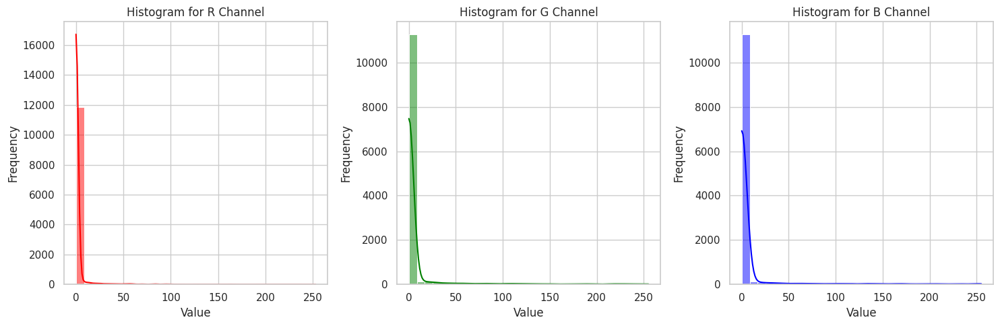

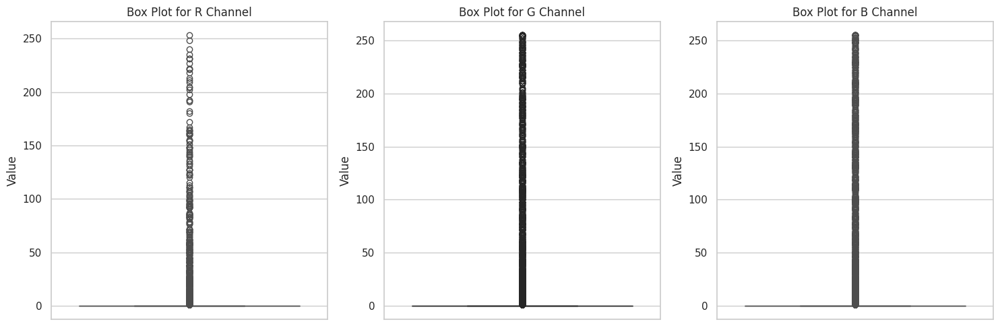

In [ ]:
# Set the style for the plots
sns.set(style='whitegrid')

# Create a figure with 3 subplots
plt.figure(figsize=(15, 5))

# Histogram for R
plt.subplot(1, 3, 1)
sns.histplot(cleaned_target_dataset['R'], bins=30, kde=True, color='red')
plt.title('Histogram for R Channel')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Histogram for G
plt.subplot(1, 3, 2)
sns.histplot(cleaned_target_dataset['G'], bins=30, kde=True, color='green')
plt.title('Histogram for G Channel')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Histogram for B
plt.subplot(1, 3, 3)
sns.histplot(cleaned_target_dataset['B'], bins=30, kde=True, color='blue')
plt.title('Histogram for B Channel')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.tight_layout()
plt.show()

import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plots
sns.set(style='whitegrid')

# Create a figure for the box plots
plt.figure(figsize=(15, 5))

# Box plot for R
plt.subplot(1, 3, 1)
sns.boxplot(data=cleaned_target_dataset['R'], color='red')
plt.title('Box Plot for R Channel')
plt.ylabel('Value')

# Box plot for G
plt.subplot(1, 3, 2)
sns.boxplot(data=cleaned_target_dataset['G'], color='green')
plt.title('Box Plot for G Channel')
plt.ylabel('Value')

# Box plot for B
plt.subplot(1, 3, 3)
sns.boxplot(data=cleaned_target_dataset['B'], color='blue')
plt.title('Box Plot for B Channel')
plt.ylabel('Value')

# Show the plot
plt.tight_layout()
plt.show()



## Drop columns not required in EDA + Modeling

In [ ]:
cleaned_target_dataset.columns

Index(['Latitude_Degrees', 'Longitude_Degrees', 'Date', 'Depth_m',
       'Unnamed: 0', 'Site_ID', 'Sample_ID', 'Data_Source', 'Ocean_Name',
       'Reef_ID', 'Realm_Name', 'Ecoregion_Name', 'Country_Name',
       'State_Island_Province_Name', 'City_Town_Name', 'Site_Name',
       'Distance_to_Shore', 'Exposure', 'Turbidity', 'Cyclone_Frequency',
       'Date_Day', 'Date_Month', 'Date_Year', 'Bleaching_Level',
       'Percent_Bleaching', 'ClimSST', 'Temperature_Kelvin',
       'Temperature_Mean', 'Temperature_Minimum', 'Temperature_Maximum',
       'Temperature_Kelvin_Standard_Deviation', 'Windspeed', 'SSTA',
       'SSTA_Standard_Deviation', 'SSTA_Mean', 'SSTA_Minimum', 'SSTA_Maximum',
       'SSTA_Frequency', 'SSTA_Frequency_Standard_Deviation',
       'SSTA_FrequencyMax', 'SSTA_FrequencyMean', 'SSTA_DHW',
       'SSTA_DHW_Standard_Deviation', 'SSTA_DHWMax', 'SSTA_DHWMean', 'TSA',
       'TSA_Standard_Deviation', 'TSA_Minimum', 'TSA_Maximum', 'TSA_Mean',
       'TSA_Frequency', 'TSA_

In [ ]:
# Define the list of columns to drop
columns_to_drop = ['Unnamed: 0', 'Bleaching_Comments', 'Site_Comments',
                   'Sample_Comments', 'RGB', 'Other', 'Data_Source']

# Drop the specified columns
cleaned_column_target_dataset = cleaned_target_dataset.drop(columns=columns_to_drop)

# Display the first few rows of the cleaned dataset to verify
cleaned_column_target_dataset

,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Site_ID,Sample_ID,Ocean_Name,Reef_ID,Realm_Name,Ecoregion_Name,...,REEF_ID,VISIT_NO,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,R,G,B
0,-28.8645,114.001200,2005-09-13,11.0,1029.0,10309610.0,Indian,114.0.7E.28.51.87S,Temperate Australasia,Houtman Abrolhos Islands west Australia,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1,-28.1625,153.531100,2016-04-19,4.0,166.0,10315089.0,Pacific,153.531103E.28.162527S,Temperate Australasia,Moreton Bay eastern Australia,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
2,-28.1092,153.475800,2007-10-01,9.0,167.0,10314952.0,Pacific,153.28.33E.28.6.33S,Temperate Australasia,Moreton Bay eastern Australia,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
3,-28.1092,153.475800,2008-08-03,9.0,167.0,10314957.0,Pacific,153.28.33E.28.6.33S,Temperate Australasia,Moreton Bay eastern Australia,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
4,-28.1092,153.475800,2009-09-20,9.0,167.0,10314959.0,Pacific,153.28.33E.28.6.33S2,Temperate Australasia,Moreton Bay eastern Australia,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17608,-16.2924,145.496883,2016-06-07,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,12.0,2016.0,NaN,Wet Tropics,Snapper North,86.25,0,0,0
17609,-16.2924,145.496883,2017-09-04,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.0,2017.0,NaN,Wet Tropics,Snapper North,93.50,0,0,0
17610,-16.2924,145.496883,2018-07-28,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,14.0,2018.0,NaN,Wet Tropics,Snapper North,90.25,0,0,0
17611,-16.2924,145.496883,2019-08-08,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,15.0,2019.0,NaN,Wet Tropics,Snapper North,86.88,0,0,0


In [ ]:
# Fill null values in REEF_ID with values from Reef_ID if Reef_ID is not null
cleaned_column_target_dataset['REEF_ID'] = cleaned_column_target_dataset['REEF_ID'].fillna(cleaned_column_target_dataset['Reef_ID'])

# Drop the Reef_ID column
cleaned_column_target_dataset.drop(columns=['Reef_ID'], inplace=True)

In [ ]:
# Count the number of null values in each column
null_counts = cleaned_column_target_dataset.isnull().sum()

# Display the count of null values for each column
null_counts[null_counts > 0]  # This will only show columns with null values

,0
Depth_m,1124
Site_ID,2361
Sample_ID,2361
Ocean_Name,2361
Realm_Name,2361
...,...
YEAR_CODE,9958
REPORT_YEAR,11195
NRM_REGION,11082
MMP_SITE_NAME,11082


In [ ]:
# Identify numerical features
numerical_features = cleaned_column_target_dataset.select_dtypes(include=['number']).columns.tolist()

# Identify categorical features
categorical_features = cleaned_column_target_dataset.select_dtypes(include=['object', 'category']).columns.tolist()

# Display the results
print("Numerical Features:", numerical_features)
print("Categorical Features:", categorical_features)
print("Count of Numerical Features:", len(numerical_features))
print("Count of Categorical Features:", len(categorical_features))

Numerical Features: ['Latitude_Degrees', 'Longitude_Degrees', 'Depth_m', 'Site_ID', 'Sample_ID', 'Distance_to_Shore', 'Turbidity', 'Cyclone_Frequency', 'Date_Day', 'Date_Month', 'Date_Year', 'Percent_Bleaching', 'ClimSST', 'Temperature_Kelvin', 'Temperature_Mean', 'Temperature_Minimum', 'Temperature_Maximum', 'Temperature_Kelvin_Standard_Deviation', 'Windspeed', 'SSTA', 'SSTA_Standard_Deviation', 'SSTA_Mean', 'SSTA_Minimum', 'SSTA_Maximum', 'SSTA_Frequency', 'SSTA_Frequency_Standard_Deviation', 'SSTA_FrequencyMax', 'SSTA_FrequencyMean', 'SSTA_DHW', 'SSTA_DHW_Standard_Deviation', 'SSTA_DHWMax', 'SSTA_DHWMean', 'TSA', 'TSA_Standard_Deviation', 'TSA_Minimum', 'TSA_Maximum', 'TSA_Mean', 'TSA_Frequency', 'TSA_Frequency_Standard_Deviation', 'TSA_FrequencyMax', 'TSA_FrequencyMean', 'TSA_DHW', 'TSA_DHW_Standard_Deviation', 'TSA_DHWMax', 'TSA_DHWMean', 'MPA', 'HDI', '50reef_connpos', '50reef_connpe', '50reef_cyclavg', '50reef_cyclmax', '50reef_cyclirt1', '50reef_nearest__lat', '50reef_nearest_l

## EDA for categorical features

In [ ]:
# Get unique values for each categorical column
unique_values_cat = {col: cleaned_column_target_dataset[col].unique() for col in categorical_features}

# Display the unique values
for col, values in unique_values_cat.items():
    print(f"Unique values in '{col}': {values}")

Unique values in 'Date': ['2005-09-13' '2016-04-19' '2007-10-01' ... '2019-08-09' '2005-12-14'
 '2012-11-19']
Unique values in 'Ocean_Name': ['Indian' 'Pacific' 'Atlantic' 'Red Sea' 'Arabian Gulf' nan]
Unique values in 'Realm_Name': ['Temperate Australasia' 'Western Indo-Pacific' 'Central Indo-Pacific'
 'Eastern Indo-Pacific' 'Tropical Atlantic' 'Tropical Eastern Pacific'
 'Temperate Northern Pacific' nan]
Unique values in 'Ecoregion_Name': ['Houtman Abrolhos Islands west Australia' 'Moreton Bay eastern Australia'
 'Eastern coast South Africa' 'Southern Great Barrier Reef'
 'Austral Islands French Polynesia' 'South Madagascar'
 'Western Tuamotu Archipelago central Pacific' 'New Caledonia'
 'Ningaloo Reef and coastal north-west Australia' 'Mascarene Islands'
 'Central and northern Great Barrier Reef' 'Vanuatu'
 'Samoa Tuvalu and Tonga' 'Cook Islands south-west Pacific' 'Fiji'
 'Brazil' 'Society Islands French Polynesia' 'Coral Sea'
 'North Madagascar' 'Mayotte and Comoros' 'North Mozamb

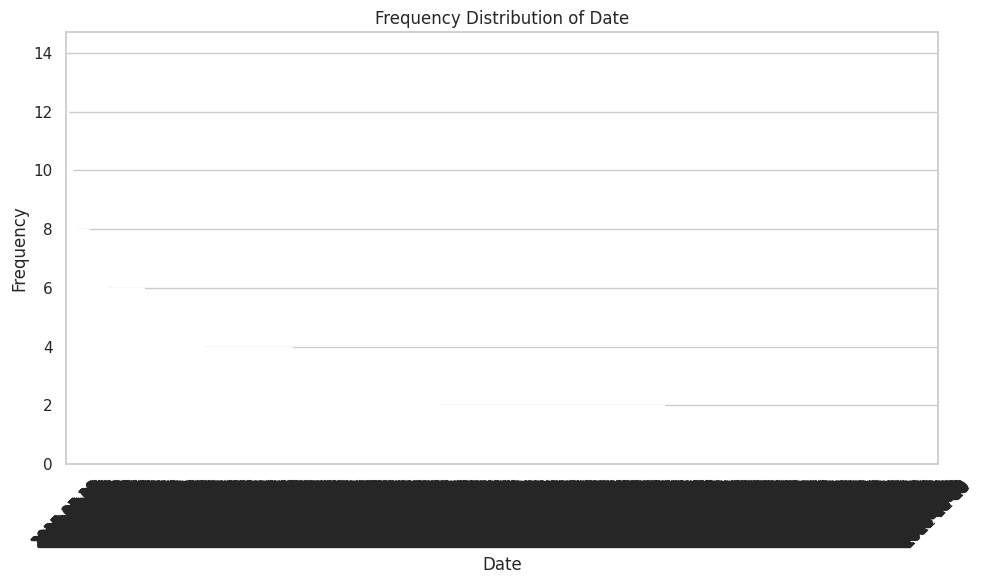

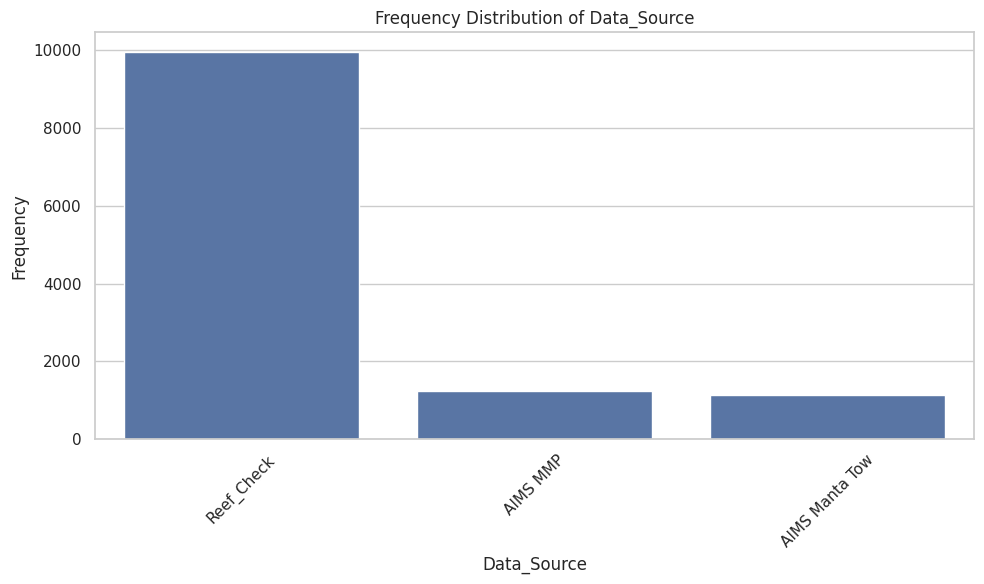

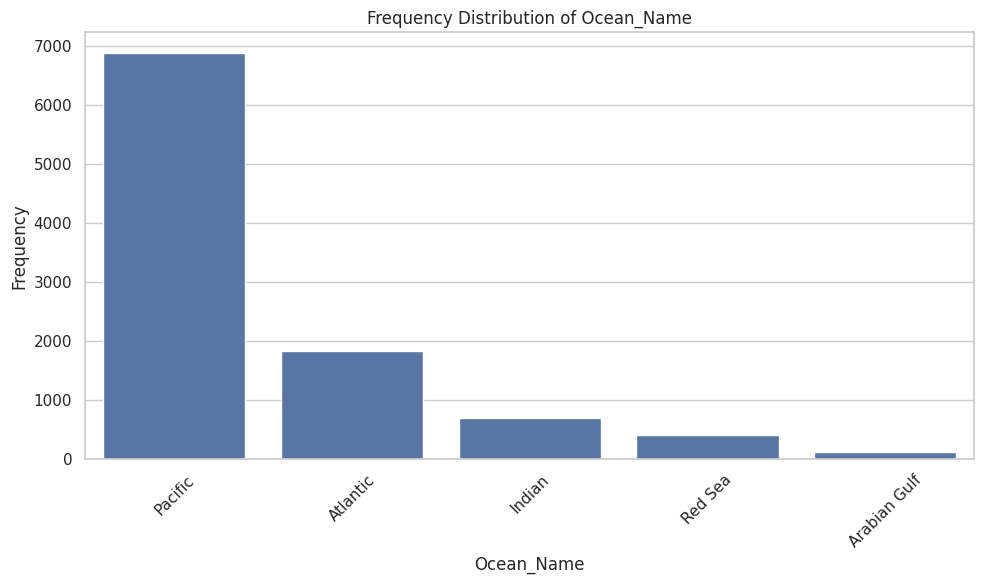

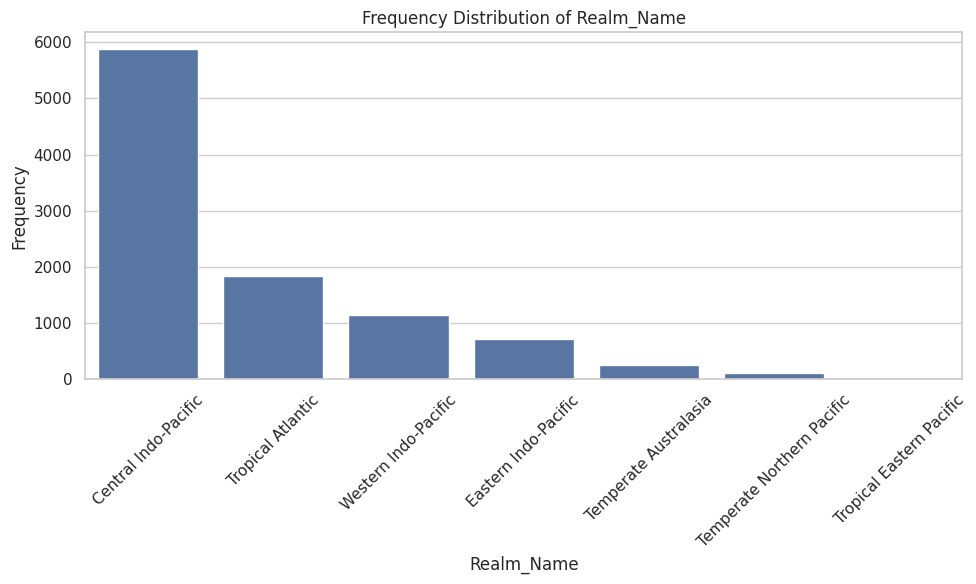

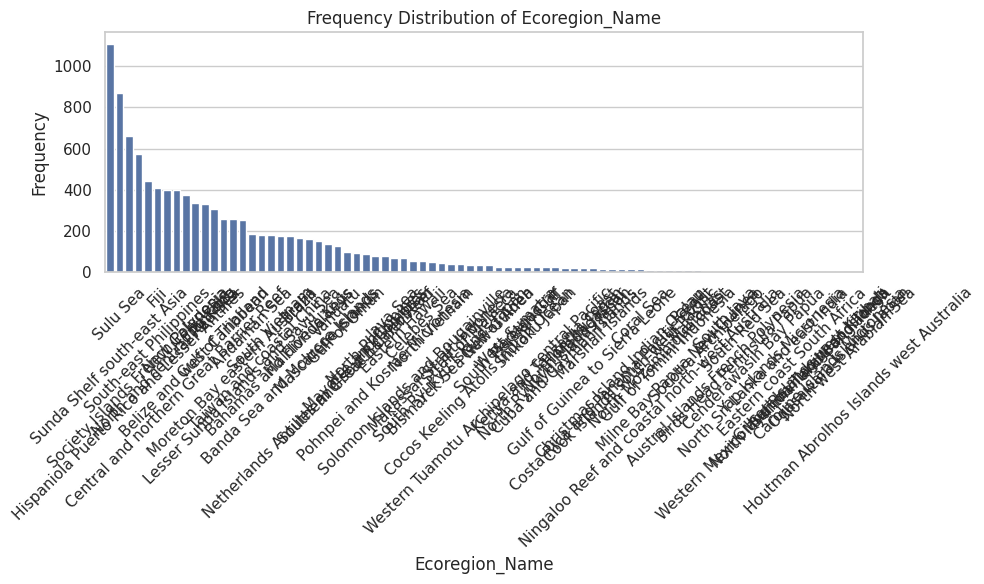

...

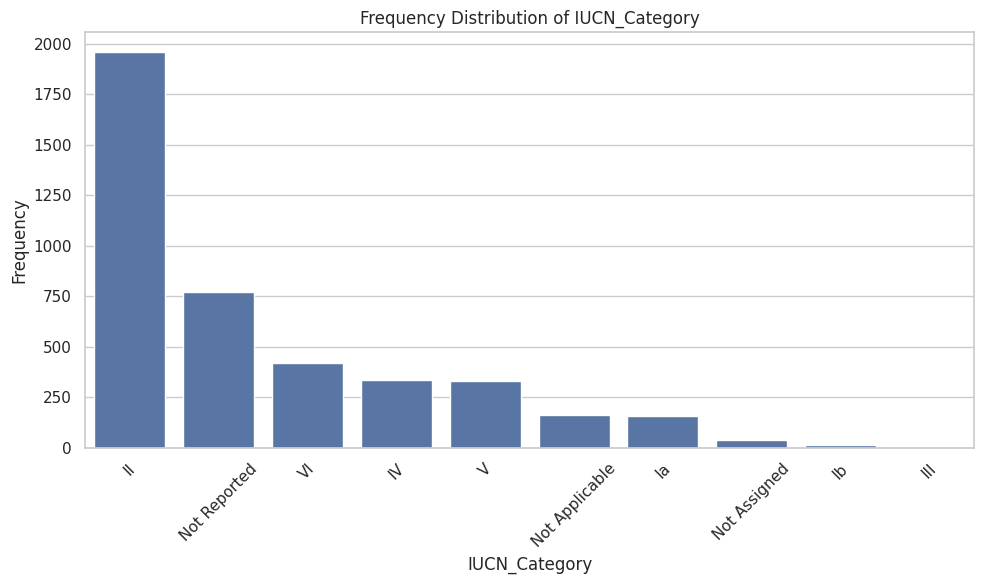

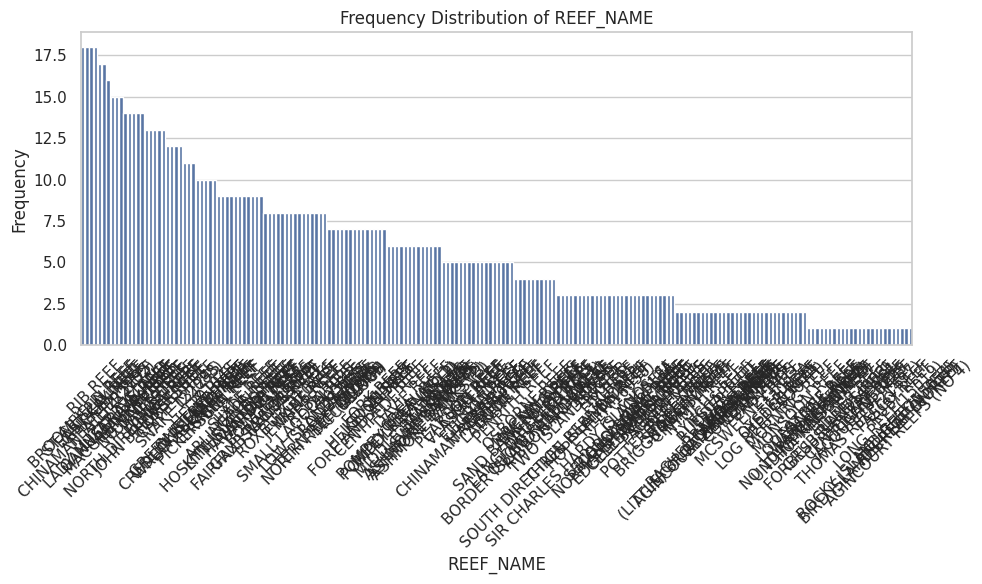

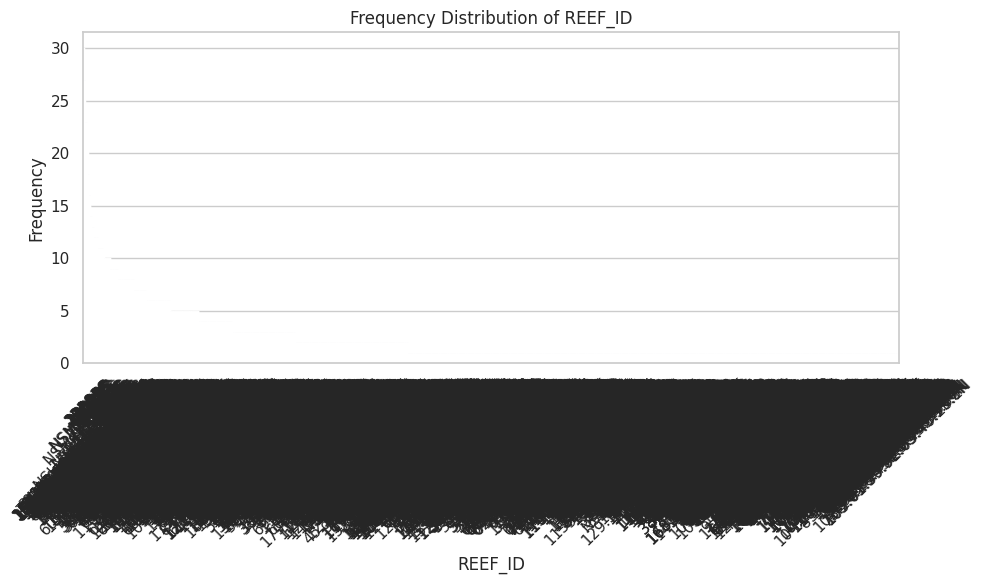

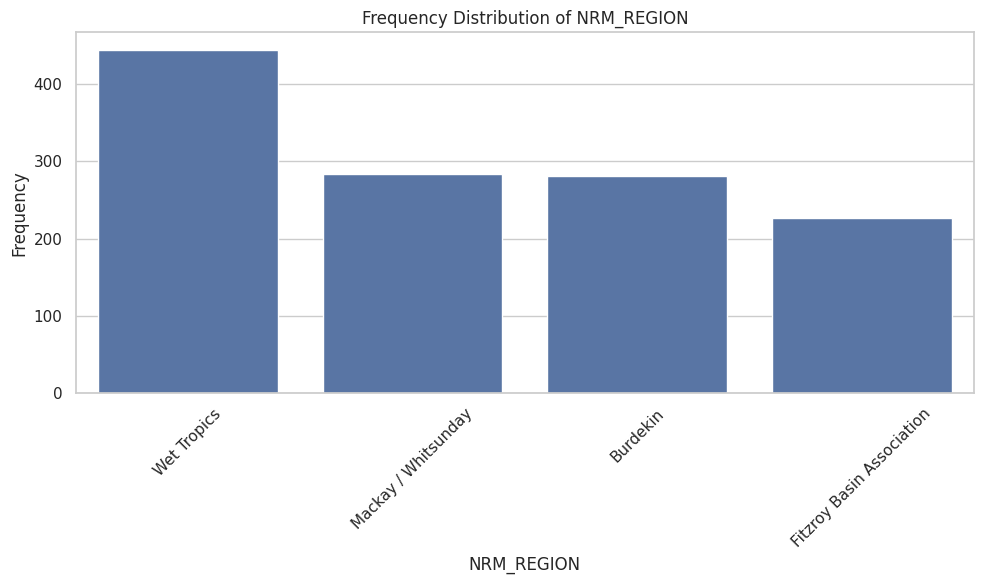

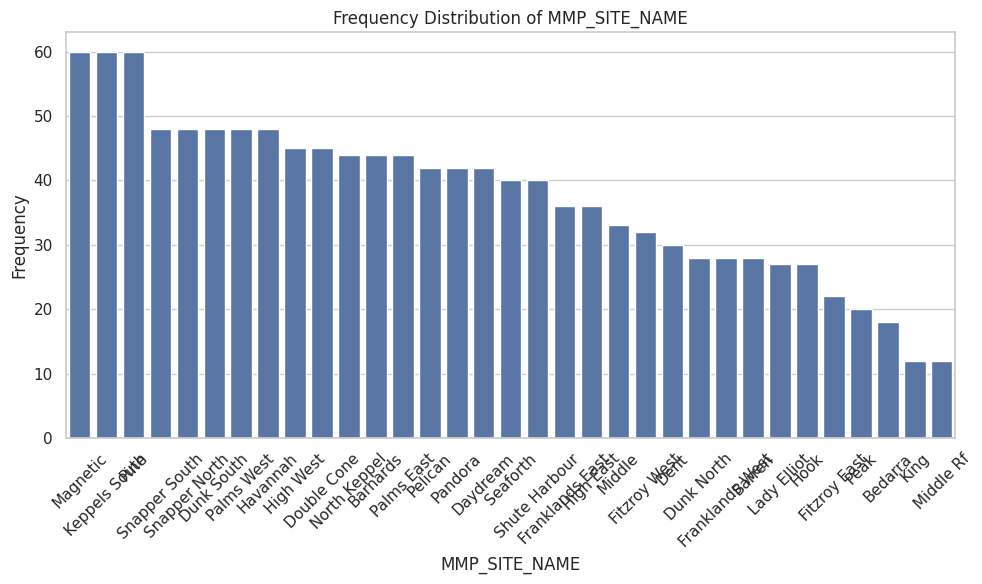

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the visualization
sns.set(style="whitegrid")

# Loop through each categorical feature and create a count plot
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=cleaned_column_target_dataset, x=feature, order=cleaned_column_target_dataset[feature].value_counts().index)
    plt.title(f'Frequency Distribution of {feature}')
    plt.xticks(rotation=45)  # Rotate x labels for better readability
    plt.ylabel('Frequency')
    plt.xlabel(feature)
    plt.tight_layout()
    plt.show()

In [ ]:
# Step 1: Drop 'Date' column
cleaned_column_target_dataset_encoded = cleaned_column_target_dataset.drop(columns=['Date'])
cat = categorical_features[1:]

# Step 2: One-hot encode categorical features
one_hot_encoded = pd.get_dummies(cleaned_column_target_dataset_encoded[cat], drop_first=True)

# Step 3: Combine one-hot encoded features with the original dataset
# Exclude original categorical features from the main dataset
cleaned_column_target_dataset_encoded = pd.concat([cleaned_column_target_dataset.drop(columns=cat), one_hot_encoded], axis=1)
cleaned_column_target_dataset_encoded


,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Site_ID,Sample_ID,Distance_to_Shore,Turbidity,Cyclone_Frequency,Date_Day,...,MMP_SITE_NAME_Palms East,MMP_SITE_NAME_Palms West,MMP_SITE_NAME_Pandora,MMP_SITE_NAME_Peak,MMP_SITE_NAME_Pelican,MMP_SITE_NAME_Pine,MMP_SITE_NAME_Seaforth,MMP_SITE_NAME_Shute Harbour,MMP_SITE_NAME_Snapper North,MMP_SITE_NAME_Snapper South
0,-28.8645,114.001200,2005-09-13,11.0,1029.0,10309610.0,9.47,0.0638,45.60,13.0,...,False,False,False,False,False,False,False,False,False,False
1,-28.1625,153.531100,2016-04-19,4.0,166.0,10315089.0,407.22,0.0935,44.56,19.0,...,False,False,False,False,False,False,False,False,False,False
2,-28.1092,153.475800,2007-10-01,9.0,167.0,10314952.0,730.91,0.1064,44.56,1.0,...,False,False,False,False,False,False,False,False,False,False
3,-28.1092,153.475800,2008-08-03,9.0,167.0,10314957.0,730.91,0.1064,44.56,3.0,...,False,False,False,False,False,False,False,False,False,False
4,-28.1092,153.475800,2009-09-20,9.0,167.0,10314959.0,730.91,0.1064,44.56,20.0,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17608,-16.2924,145.496883,2016-06-07,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,True,False
17609,-16.2924,145.496883,2017-09-04,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,True,False
17610,-16.2924,145.496883,2018-07-28,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,True,False
17611,-16.2924,145.496883,2019-08-08,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,False,False,True,False


# **Use this dataset for modeling**

Saved to coralsense_modeling_dataset.csv

In [ ]:
# Add the 'Date' column to the encoded DataFrame
cleaned_column_target_dataset_encoded['Date'] = cleaned_column_target_dataset['Date'].values

In [ ]:
cat_col = list(cleaned_column_target_dataset_encoded.columns)

In [ ]:
# Save unique_samples DataFrame as a CSV file -- DO NOT RUN
cleaned_column_target_dataset_encoded.to_csv('coralsense_modeling_dataset.csv', mode='w', header=True, index=False)

This gives the features that have a greater correlation than 0.7 with the target variable 'Hard Coral'.

High correlations with 'Hard Coral':
Hard Coral    1.000000
Algae        -0.703802
Name: Hard Coral, dtype: float64


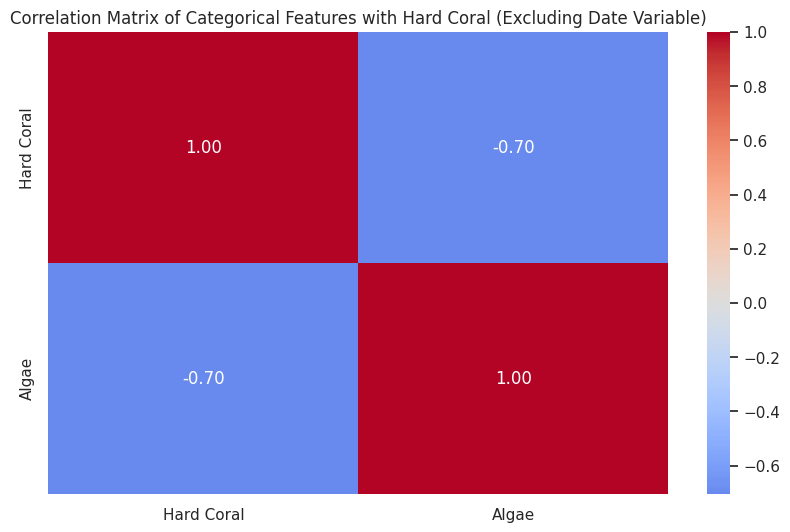

In [ ]:
cleaned_column_target_dataset_nodate = cleaned_column_target_dataset_encoded.drop(columns=['Date'])

# Calculate the correlation matrix
correlation_matrix = cleaned_column_target_dataset_nodate.corr()

# Extract correlations with the 'Hard Coral' column
hard_coral_correlations = correlation_matrix['Hard Coral']

# Filter correlations greater than 0.7 or less than -0.7
high_correlations = hard_coral_correlations[(hard_coral_correlations > 0.7) | (hard_coral_correlations < -0.7)]

# Print high correlations
print("High correlations with 'Hard Coral':")
print(high_correlations)

# Plot the correlations
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix[high_correlations.index].loc[high_correlations.index],
             annot=True, cmap='coolwarm', center=0, fmt=".2f")
plt.title('Correlation Matrix of Categorical Features with Hard Coral (Excluding Date Variable)')
plt.show()


This gives the features that have a high correlation with each other (above 0.7)

Google sheet link: https://docs.google.com/spreadsheets/d/1fxxPRlUWRzlLvMmnschKsIuWS0wm-XOv77cj8uzKBts#gid=0

In [ ]:
# Get the absolute values of the correlations
absolute_correlation_matrix = correlation_matrix.abs()

# Find pairs of features with high correlation
high_correlation_pairs = []

for col in absolute_correlation_matrix.columns:
    high_correlations = absolute_correlation_matrix[col][absolute_correlation_matrix[col] > 0.7]
    for index in high_correlations.index:
        if col != index:  # Exclude self-correlations
            high_correlation_pairs.append((col, index, high_correlations[index]))

# Remove duplicates (e.g., (A, B) and (B, A))
high_correlation_pairs = list(set([tuple(sorted(pair[:2])) + (pair[2],) for pair in high_correlation_pairs]))

# Convert to DataFrame for better readability
high_correlation_df = pd.DataFrame(high_correlation_pairs, columns=['Feature 1', 'Feature 2', 'Correlation'])

# Sort by correlation value
high_correlation_df.sort_values(by='Correlation', ascending=False, inplace=True)
high_correlation_df

,Feature 1,Feature 2,Correlation
490,REPORT_YEAR,YEAR_CODE,1.000000
0,REEF_ID_159.46.8E.18.49.2S,Site_Name_Beacon,1.000000
1229,City_Town_Name_Saadiyat Island,State_Island_Province_Name_Abu Dhabi,1.000000
1261,Country_Name_Guatemala,State_Island_Province_Name_Izabal Department,1.000000
1260,REEF_NAME_14075S,Site_Name_14075S,1.000000
...,...,...,...
383,Algae,Hard Coral,0.703802
1508,Ecoregion_Name_Hong Kong,SSTA_DHWMax,0.703260
230,Country_Name_China,SSTA_DHWMax,0.703260
1103,SSTA_DHWMax,State_Island_Province_Name_Hong Kong,0.702590


## EDA for numerical data

In [ ]:
numerical_features

['Latitude_Degrees',
 'Longitude_Degrees',
 'Depth_m',
 'Site_ID',
 'Sample_ID',
 'Distance_to_Shore',
 'Turbidity',
 'Cyclone_Frequency',
 'Date_Day',
 'Date_Month',
 'Date_Year',
 'Percent_Bleaching',
 'ClimSST',
 'Temperature_Kelvin',
 'Temperature_Mean',
 'Temperature_Minimum',
 'Temperature_Maximum',
 'Temperature_Kelvin_Standard_Deviation',
 'Windspeed',
 'SSTA',
 'SSTA_Standard_Deviation',
 'SSTA_Mean',
 'SSTA_Minimum',
 'SSTA_Maximum',
 'SSTA_Frequency',
 'SSTA_Frequency_Standard_Deviation',
 'SSTA_FrequencyMax',
 'SSTA_FrequencyMean',
 'SSTA_DHW',
 'SSTA_DHW_Standard_Deviation',
 'SSTA_DHWMax',
 'SSTA_DHWMean',
 'TSA',
 'TSA_Standard_Deviation',
 'TSA_Minimum',
 'TSA_Maximum',
 'TSA_Mean',
 'TSA_Frequency',
 'TSA_Frequency_Standard_Deviation',
 'TSA_FrequencyMax',
 'TSA_FrequencyMean',
 'TSA_DHW',
 'TSA_DHW_Standard_Deviation',
 'TSA_DHWMax',
 'TSA_DHWMean',
 'MPA',
 'HDI',
 '50reef_connpos',
 '50reef_connpe',
 '50reef_cyclavg',
 '50reef_cyclmax',
 '50reef_cyclirt1',
 '50reef_

In [ ]:
summary_statistics = cleaned_column_target_dataset_encoded.describe()
summary_statistics

,Latitude_Degrees,Longitude_Degrees,Depth_m,Site_ID,Sample_ID,Distance_to_Shore,Turbidity,Cyclone_Frequency,Date_Day,Date_Month,...,Hard Coral,Nutrient Indicator Algae,Soft Coral,VISIT_NO,YEAR_CODE,REPORT_YEAR,Algae,R,G,B
count,12319.000000,12319.000000,11195.000000,9958.000000,9.958000e+03,9957.000000,9956.000000,9958.000000,9958.000000,9958.000000,...,12319.000000,9570.000000,2361.000000,2361.000000,2361.000000,1124.000000,1237.000000,12319.000000,12319.000000,12319.000000
mean,-1.257855,79.126841,5.511693,5298.767021,1.031476e+07,3084.404754,0.076215,51.192957,16.177445,6.765816,...,31.333490,6.649089,5.973146,13.574756,96764.932656,2011.320285,52.748747,2.349054,7.949103,8.814189
std,16.461663,94.499155,3.183811,3289.101902,4.242688e+03,11491.052029,0.068435,6.308458,8.551679,3.051858,...,19.802784,11.838552,6.967069,7.570434,99423.292684,5.661472,19.598662,15.349501,33.407528,36.111742
min,-28.864500,-179.974300,0.100000,3.000000,1.030760e+07,3.680000,0.000000,19.860000,1.000000,1.000000,...,0.000000,0.000000,0.000000,1.000000,2005.000000,2003.000000,8.380000,0.000000,0.000000,0.000000
25%,-17.219550,45.165800,3.000000,3242.250000,1.031097e+07,95.430000,0.036800,47.940000,9.000000,4.000000,...,15.000000,0.000000,2.250000,8.000000,2012.000000,2006.000000,37.880000,0.000000,0.000000,0.000000
50%,2.759900,116.359500,5.000000,5529.000000,1.031481e+07,264.100000,0.057100,49.910000,16.000000,7.000000,...,28.120000,1.250000,3.333000,13.000000,2020.000000,2011.000000,49.880000,0.000000,0.000000,0.000000
75%,11.836700,146.332067,7.000000,6834.000000,1.031850e+07,1044.680000,0.083725,54.380000,24.000000,9.000000,...,45.000000,7.500000,7.500000,18.000000,200910.000000,2016.000000,67.950000,0.000000,0.000000,0.000000
max,34.802700,179.964500,24.000000,15736.000000,1.032208e+07,149777.990000,1.163500,92.300000,31.000000,12.000000,...,93.750000,87.500000,49.630000,29.000000,202021.000000,2021.000000,99.880000,253.000000,255.000000,255.000000


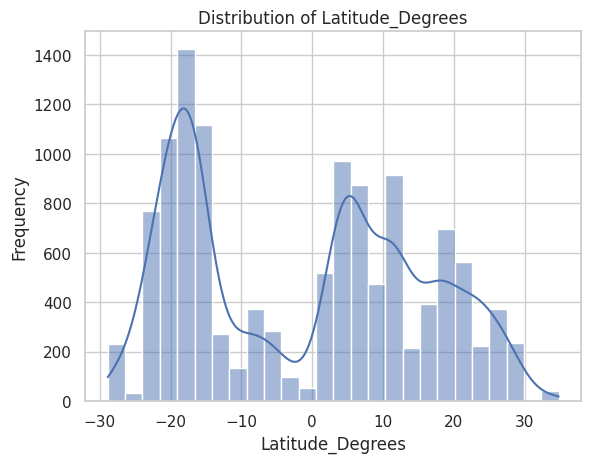

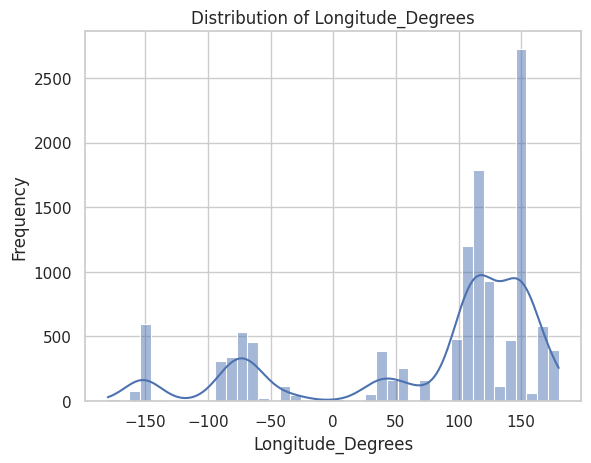

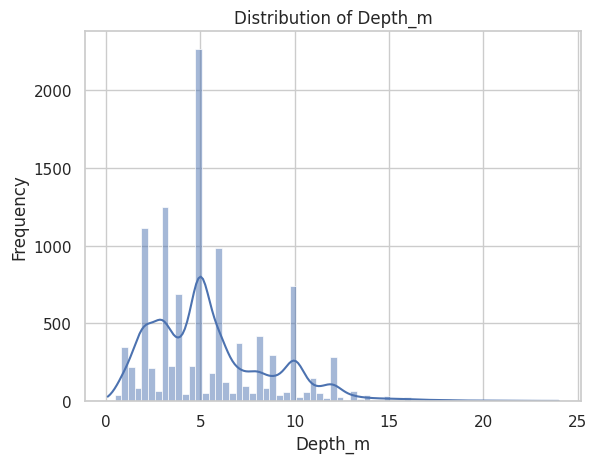

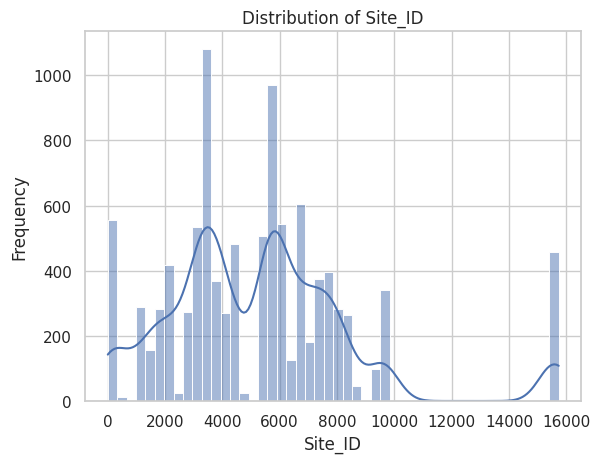

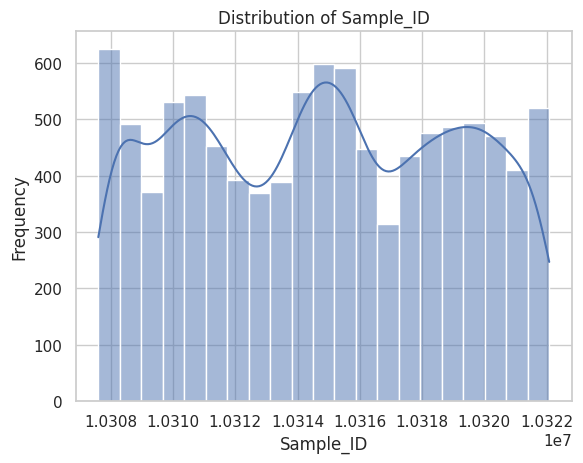

...

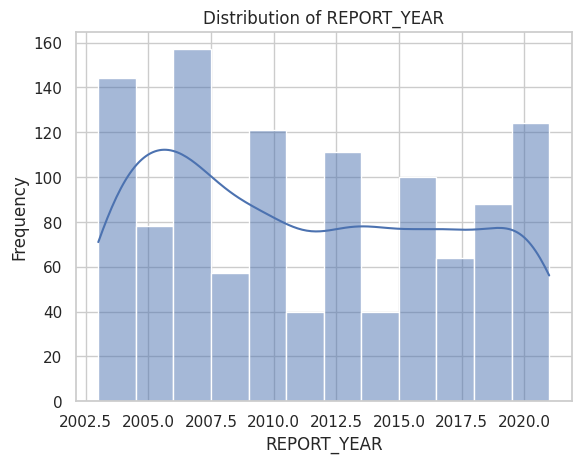

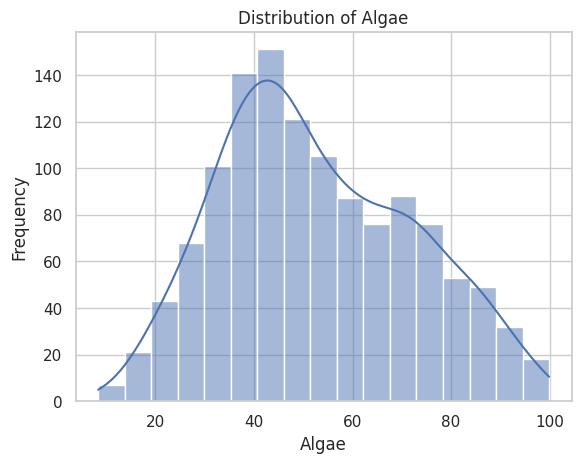

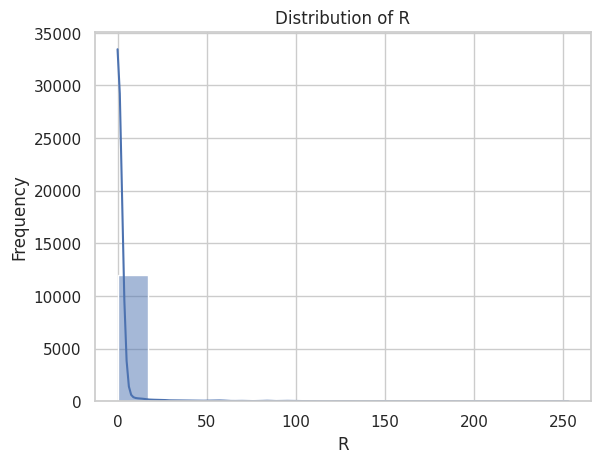

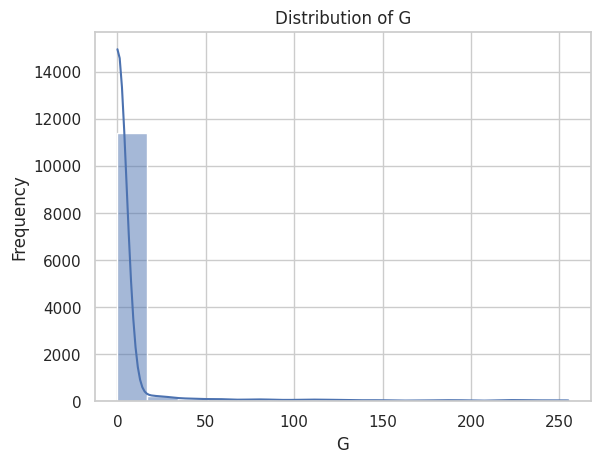

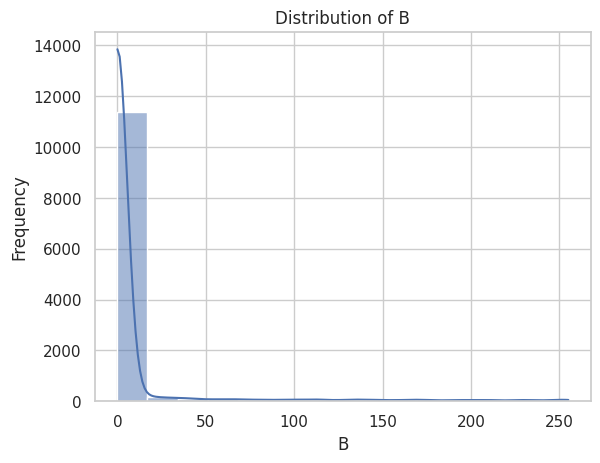

In [ ]:
# Histograms
for i, feature in enumerate(numerical_features, 1):
    sns.histplot(cleaned_column_target_dataset_encoded[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

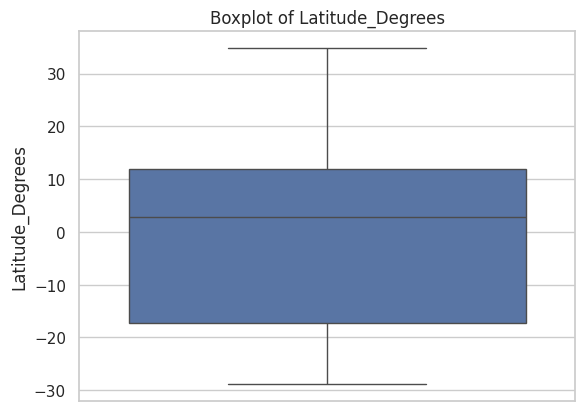

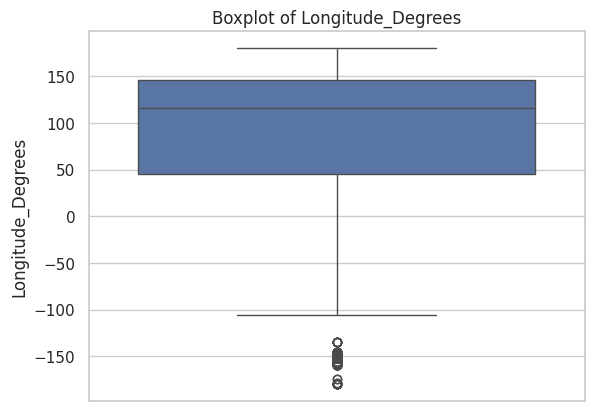

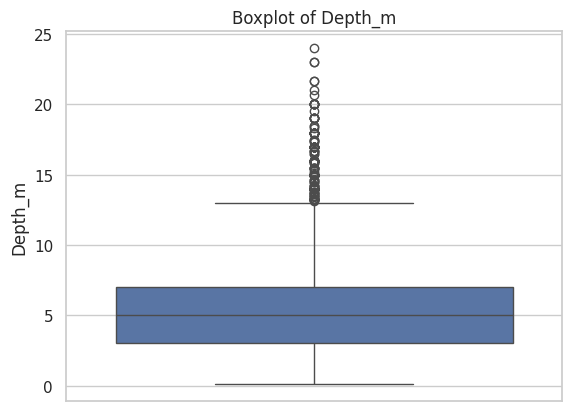

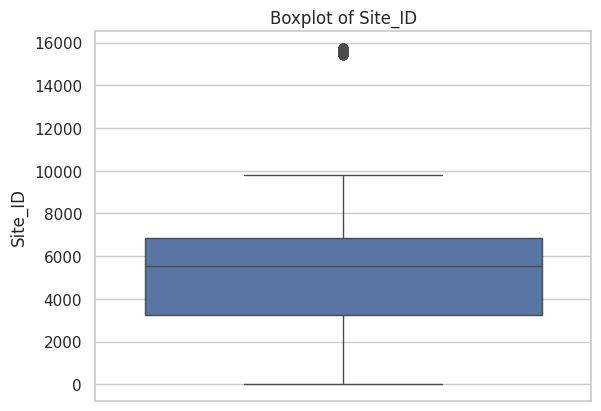

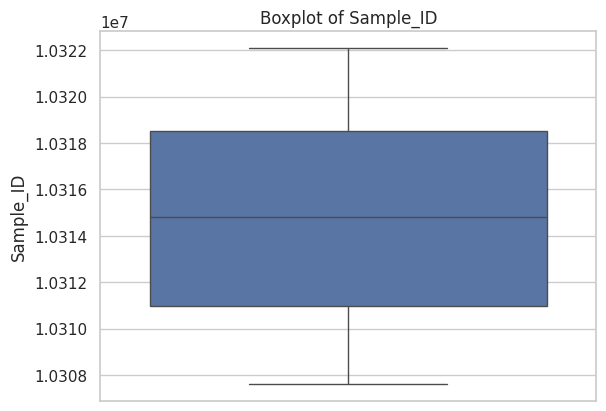

...

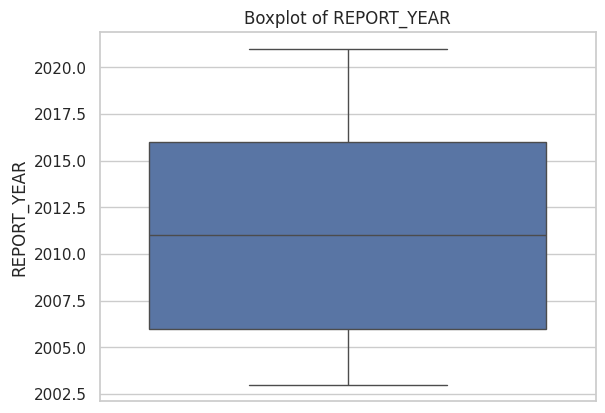

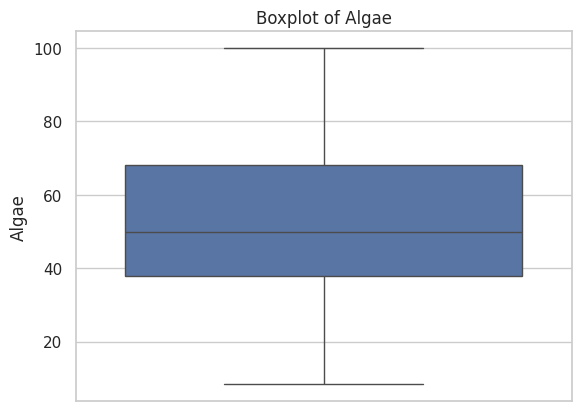

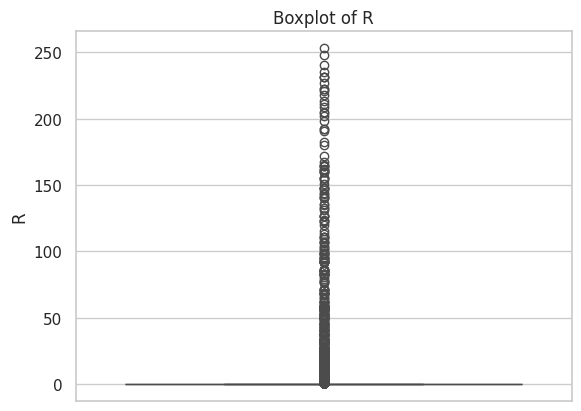

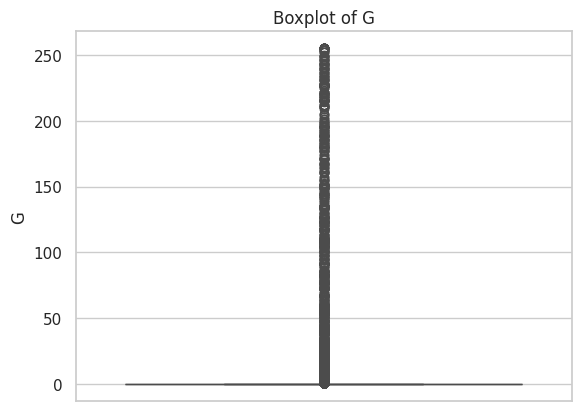

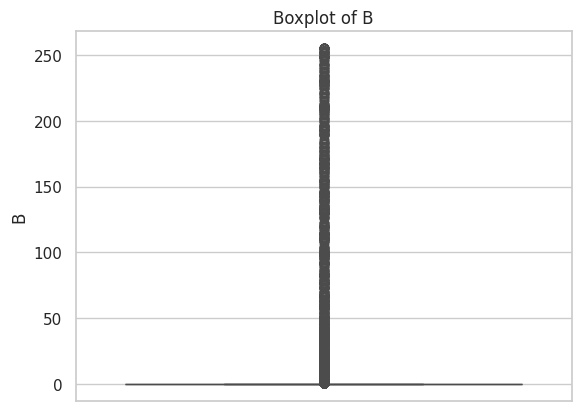

In [ ]:
# Boxplots for Outlier Detection
for i, feature in enumerate(numerical_features, 1):
    sns.boxplot(y=cleaned_column_target_dataset_encoded[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()

This is the distribution of Hard Coral (Target Variable)

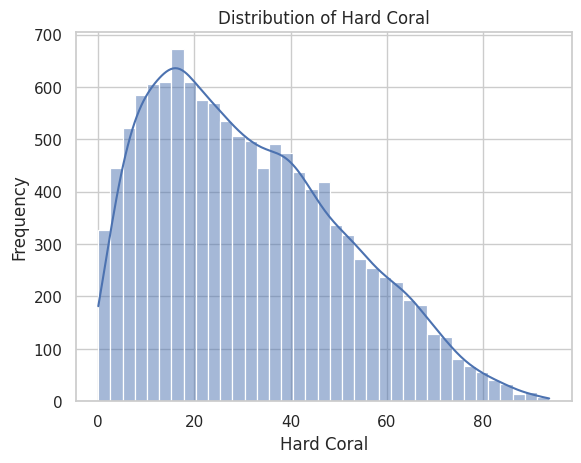

## Time series EDA

In [ ]:
import pandas as pd

cleaned_column_target_dataset_encoded = pd.read_csv('coralsense_modeling_dataset.csv')
cleaned_column_target_dataset_encoded.head(7)

Index(['Latitude_Degrees', 'Longitude_Degrees', 'Date', 'Depth_m', 'Site_ID',
       'Sample_ID', 'Ocean_Name', 'Realm_Name', 'Ecoregion_Name',
       'Country_Name', 'State_Island_Province_Name', 'City_Town_Name',
       'Site_Name', 'Distance_to_Shore', 'Exposure', 'Turbidity',
       'Cyclone_Frequency', 'Date_Day', 'Date_Month', 'Date_Year',
       'Bleaching_Level', 'Percent_Bleaching', 'ClimSST', 'Temperature_Kelvin',
       'Temperature_Mean', 'Temperature_Minimum', 'Temperature_Maximum',
       'Temperature_Kelvin_Standard_Deviation', 'Windspeed', 'SSTA',
       'SSTA_Standard_Deviation', 'SSTA_Mean', 'SSTA_Minimum', 'SSTA_Maximum',
       'SSTA_Frequency', 'SSTA_Frequency_Standard_Deviation',
       'SSTA_FrequencyMax', 'SSTA_FrequencyMean', 'SSTA_DHW',
       'SSTA_DHW_Standard_Deviation', 'SSTA_DHWMax', 'SSTA_DHWMean', 'TSA',
       'TSA_Standard_Deviation', 'TSA_Minimum', 'TSA_Maximum', 'TSA_Mean',
       'TSA_Frequency', 'TSA_Frequency_Standard_Deviation', 'TSA_FrequencyMa

In [ ]:
# Step 1: Convert the 'Date' column to datetime format
cleaned_column_target_dataset_encoded['Date'] = pd.to_datetime(cleaned_column_target_dataset_encoded['Date'])

# Step 2: Set 'Date' as the index
cleaned_column_target_dataset_encoded.set_index('Date', inplace=True)

# Verify the changes
cleaned_column_target_dataset_encoded.head()


,Latitude_Degrees,Longitude_Degrees,Depth_m,Site_ID,Sample_ID,Distance_to_Shore,Turbidity,Cyclone_Frequency,Date_Day,Date_Month,...,MMP_SITE_NAME_Palms East,MMP_SITE_NAME_Palms West,MMP_SITE_NAME_Pandora,MMP_SITE_NAME_Peak,MMP_SITE_NAME_Pelican,MMP_SITE_NAME_Pine,MMP_SITE_NAME_Seaforth,MMP_SITE_NAME_Shute Harbour,MMP_SITE_NAME_Snapper North,MMP_SITE_NAME_Snapper South
Date,,,,,,,,,,,,,,,,,,,,,
2005-09-13,-28.8645,114.0012,11.0,1029.0,10309610.0,9.47,0.0638,45.60,13.0,9.0,...,False,False,False,False,False,False,False,False,False,False
2016-04-19,-28.1625,153.5311,4.0,166.0,10315089.0,407.22,0.0935,44.56,19.0,4.0,...,False,False,False,False,False,False,False,False,False,False
2007-10-01,-28.1092,153.4758,9.0,167.0,10314952.0,730.91,0.1064,44.56,1.0,10.0,...,False,False,False,False,False,False,False,False,False,False
2008-08-03,-28.1092,153.4758,9.0,167.0,10314957.0,730.91,0.1064,44.56,3.0,8.0,...,False,False,False,False,False,False,False,False,False,False
2009-09-20,-28.1092,153.4758,9.0,167.0,10314959.0,730.91,0.1064,44.56,20.0,9.0,...,False,False,False,False,False,False,False,False,False,False


## Time series EDA for target variable Hard Coral

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA

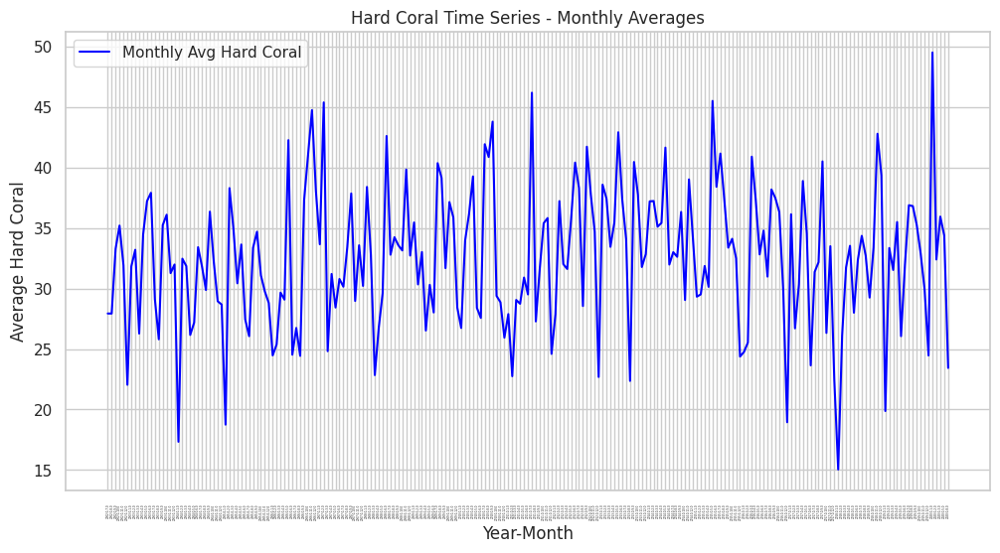

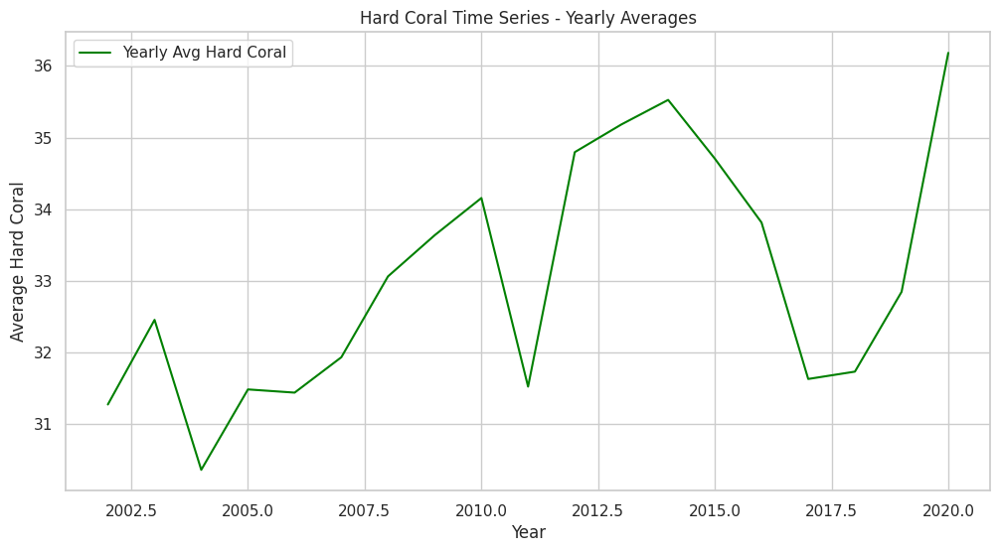

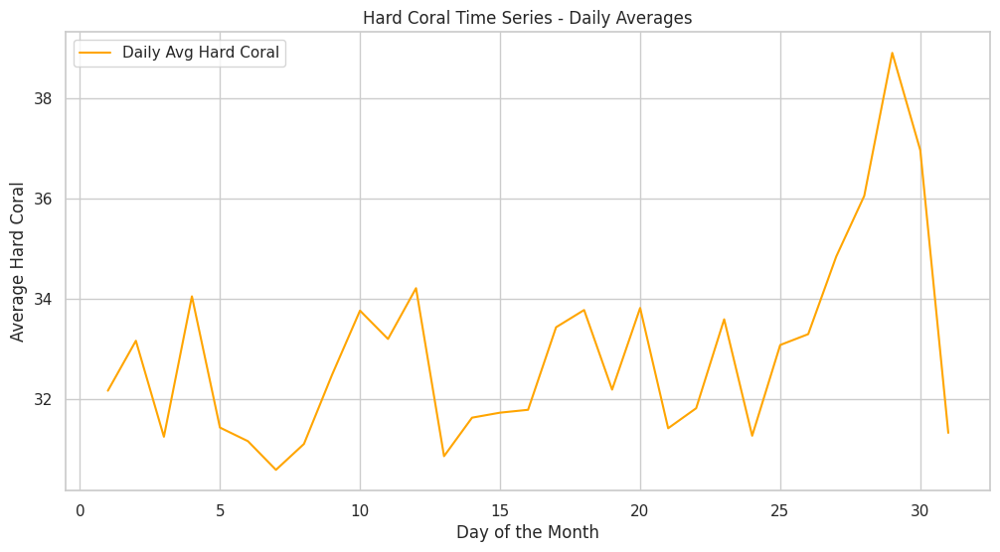

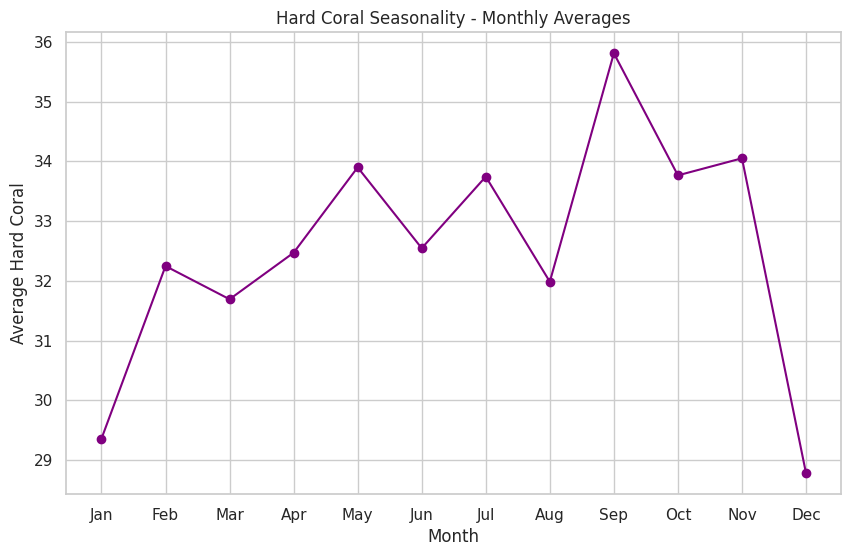

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Group by Year and Month to visualize monthly trends
monthly_avg = cleaned_column_target_dataset_encoded.groupby(['Date_Year', 'Date_Month'])['Hard Coral'].mean().reset_index()

# Create a column to represent the year-month combination for easier plotting
monthly_avg['Year_Month'] = monthly_avg['Date_Year'].astype(str) + '-' + monthly_avg['Date_Month'].astype(str)

# Plot the monthly averages
plt.figure(figsize=(12, 6))
plt.plot(monthly_avg['Year_Month'], monthly_avg['Hard Coral'], label='Monthly Avg Hard Coral', color='blue')
plt.title('Hard Coral Time Series - Monthly Averages')
plt.xlabel('Year-Month')
plt.xticks(rotation=90, fontsize=2)
plt.ylabel('Average Hard Coral')
plt.legend()
plt.show()

# 2. Group by Year to visualize yearly trends
yearly_avg = cleaned_column_target_dataset_encoded.groupby('Date_Year')['Hard Coral'].mean().reset_index()

# Plot the yearly averages
plt.figure(figsize=(12, 6))
plt.plot(yearly_avg['Date_Year'], yearly_avg['Hard Coral'], label='Yearly Avg Hard Coral', color='green')
plt.title('Hard Coral Time Series - Yearly Averages')
plt.xlabel('Year')
plt.ylabel('Average Hard Coral')
plt.legend()
plt.show()

# 3. Analyze daily patterns across the months (Optional: Seasonality based on day of the month)
daily_avg = cleaned_column_target_dataset_encoded.groupby('Date_Day')['Hard Coral'].mean().reset_index()

# Plot the daily averages
plt.figure(figsize=(12, 6))
plt.plot(daily_avg['Date_Day'], daily_avg['Hard Coral'], label='Daily Avg Hard Coral', color='orange')
plt.title('Hard Coral Time Series - Daily Averages')
plt.xlabel('Day of the Month')
plt.ylabel('Average Hard Coral')
plt.legend()
plt.show()

# 4. Group by Month to visualize seasonality patterns across months
monthly_seasonality = cleaned_column_target_dataset_encoded.groupby('Date_Month')['Hard Coral'].mean().reset_index()

# Plot the monthly seasonality
plt.figure(figsize=(10, 6))
plt.plot(monthly_seasonality['Date_Month'], monthly_seasonality['Hard Coral'], marker='o', linestyle='-', color='purple')
plt.title('Hard Coral Seasonality - Monthly Averages')
plt.xlabel('Month')
plt.ylabel('Average Hard Coral')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

In [ ]:
cleaned_column_target_dataset

,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Site_ID,Sample_ID,Ocean_Name,Realm_Name,Ecoregion_Name,Country_Name,...,REEF_ID,VISIT_NO,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,R,G,B
0,-28.8645,114.001200,2005-09-13,11.0,1029.0,10309610.0,Indian,Temperate Australasia,Houtman Abrolhos Islands west Australia,Australia,...,114.0.7E.28.51.87S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1,-28.1625,153.531100,2016-04-19,4.0,166.0,10315089.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.531103E.28.162527S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
2,-28.1092,153.475800,2007-10-01,9.0,167.0,10314952.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
3,-28.1092,153.475800,2008-08-03,9.0,167.0,10314957.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
4,-28.1092,153.475800,2009-09-20,9.0,167.0,10314959.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S2,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17608,-16.2924,145.496883,2016-06-07,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,12.0,2016.0,NaN,Wet Tropics,Snapper North,86.25,0,0,0
17609,-16.2924,145.496883,2017-09-04,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,13.0,2017.0,NaN,Wet Tropics,Snapper North,93.50,0,0,0
17610,-16.2924,145.496883,2018-07-28,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,14.0,2018.0,NaN,Wet Tropics,Snapper North,90.25,0,0,0
17611,-16.2924,145.496883,2019-08-08,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,15.0,2019.0,NaN,Wet Tropics,Snapper North,86.88,0,0,0


In [ ]:
cleaned_column_target_dataset.columns

Index(['Latitude_Degrees', 'Longitude_Degrees', 'Date', 'Depth_m', 'Site_ID',
       'Sample_ID', 'Ocean_Name', 'Realm_Name', 'Ecoregion_Name',
       'Country_Name', 'State_Island_Province_Name', 'City_Town_Name',
       'Site_Name', 'Distance_to_Shore', 'Exposure', 'Turbidity',
       'Cyclone_Frequency', 'Date_Day', 'Date_Month', 'Date_Year',
       'Bleaching_Level', 'Percent_Bleaching', 'ClimSST', 'Temperature_Kelvin',
       'Temperature_Mean', 'Temperature_Minimum', 'Temperature_Maximum',
       'Temperature_Kelvin_Standard_Deviation', 'Windspeed', 'SSTA',
       'SSTA_Standard_Deviation', 'SSTA_Mean', 'SSTA_Minimum', 'SSTA_Maximum',
       'SSTA_Frequency', 'SSTA_Frequency_Standard_Deviation',
       'SSTA_FrequencyMax', 'SSTA_FrequencyMean', 'SSTA_DHW',
       'SSTA_DHW_Standard_Deviation', 'SSTA_DHWMax', 'SSTA_DHWMean', 'TSA',
       'TSA_Standard_Deviation', 'TSA_Minimum', 'TSA_Maximum', 'TSA_Mean',
       'TSA_Frequency', 'TSA_Frequency_Standard_Deviation', 'TSA_FrequencyMa

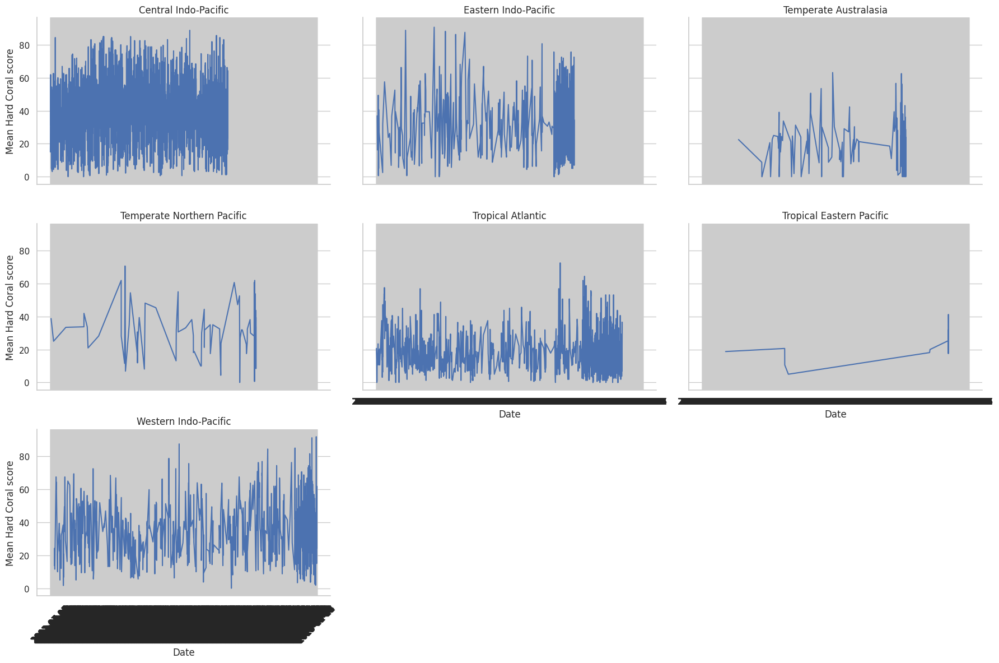

In [ ]:
# Realm Name

# Group the dataset by Realm_Name and Date, and calculate the mean hard coral score
realm_time_series = cleaned_column_target_dataset.groupby(['Realm_Name', 'Date'])['Hard Coral'].mean().reset_index()

# Create a FacetGrid to plot separate plots for each Realm_Name
g = sns.FacetGrid(realm_time_series, col='Realm_Name', col_wrap=3, height=4, aspect=1.5)

# Map the line plot to each Realm_Name subplot
g.map(sns.lineplot, 'Date', 'Hard Coral')

# Adjust plot titles and layout
g.set_titles(col_template="{col_name}")
g.set_axis_labels('Date', 'Mean Hard Coral score')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


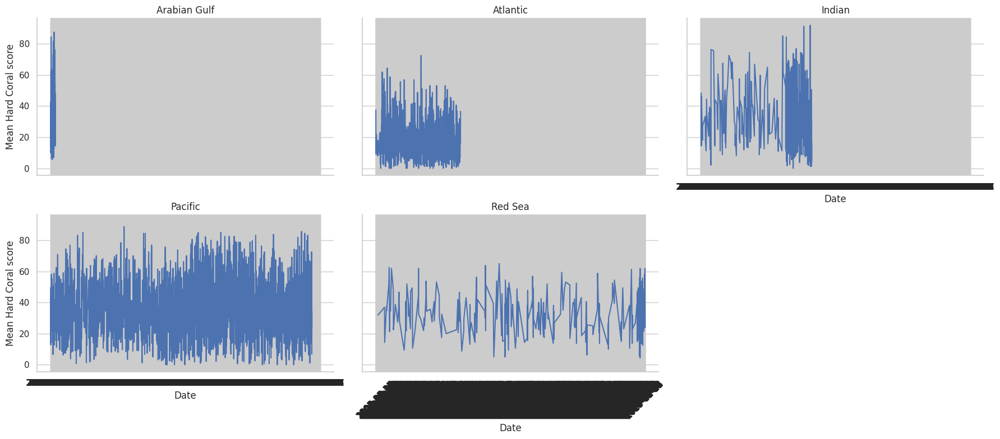

In [ ]:
# Ocean Name

# Group the dataset by Ocean Name and Date, and calculate the mean hard coral score
ocean_time_series = cleaned_column_target_dataset.groupby(['Ocean_Name', 'Date'])['Hard Coral'].mean().reset_index()

# Create a FacetGrid to plot separate plots for each Ocean_Name
g = sns.FacetGrid(ocean_time_series, col='Ocean_Name', col_wrap=3, height=4, aspect=1.5)

# Map the line plot to each Ocean_Name subplot
g.map(sns.lineplot, 'Date', 'Hard Coral')

# Adjust plot titles and layout
g.set_titles(col_template="{col_name}")
g.set_axis_labels('Date', 'Mean Hard Coral score')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

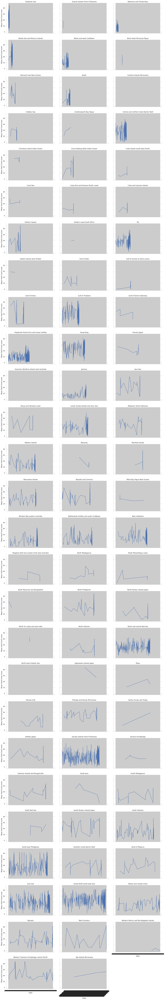

In [ ]:
# Ecoregion Name

# Group the dataset by Ecoregion Name and Date, and calculate the mean hard coral score
ecoregion_time_series = cleaned_column_target_dataset.groupby(['Ecoregion_Name', 'Date'])['Hard Coral'].mean().reset_index()

# Create a FacetGrid to plot separate plots for each Ecoregion_Name
g = sns.FacetGrid(ecoregion_time_series, col='Ecoregion_Name', col_wrap=3, height=4, aspect=1.5)

# Map the line plot to each Ecoregion_Name subplot
g.map(sns.lineplot, 'Date', 'Hard Coral')

# Adjust plot titles and layout
g.set_titles(col_template="{col_name}")
g.set_axis_labels('Date', 'Mean Hard Coral score')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import pandas as pd

cleaned_column_target_dataset = pd.read_csv('coralsense_modeling_dataset_not_encoded.csv')
cleaned_column_target_dataset.head(7)

<ipython-input-21-7e557c209aac>:3: DtypeWarning: Columns (70,75,76) have mixed types. Specify dtype option on import or set low_memory=False.
  cleaned_column_target_dataset = pd.read_csv('coralsense_modeling_dataset_not_encoded.csv')


,Latitude_Degrees,Longitude_Degrees,Date,Depth_m,Site_ID,Sample_ID,Ocean_Name,Realm_Name,Ecoregion_Name,Country_Name,...,REEF_ID,VISIT_NO,YEAR_CODE,REPORT_YEAR,NRM_REGION,MMP_SITE_NAME,Algae,R,G,B
0,-28.8645,114.0012,2005-09-13,11.0,1029.0,10309610.0,Indian,Temperate Australasia,Houtman Abrolhos Islands west Australia,Australia,...,114.0.7E.28.51.87S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1,-28.1625,153.5311,2016-04-19,4.0,166.0,10315089.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.531103E.28.162527S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
2,-28.1092,153.4758,2007-10-01,9.0,167.0,10314952.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
3,-28.1092,153.4758,2008-08-03,9.0,167.0,10314957.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
4,-28.1092,153.4758,2009-09-20,9.0,167.0,10314959.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S2,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
5,-28.1092,153.4758,2009-12-22,10.0,167.0,10314958.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
6,-28.1092,153.4758,2011-10-12,9.0,167.0,10314956.0,Pacific,Temperate Australasia,Moreton Bay eastern Australia,Australia,...,153.28.33E.28.6.33S,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0


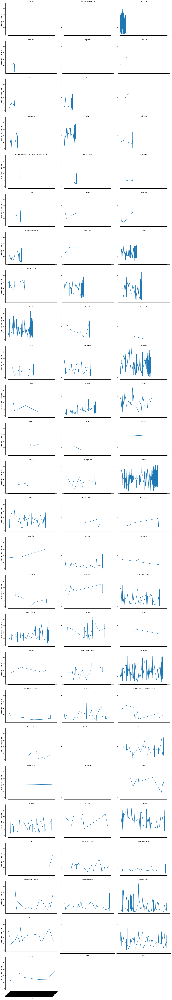

In [ ]:
# Country Name
import matplotlib.pyplot as plt

# Group the dataset by Country Name and Date, and calculate the mean hard coral score
country_time_series = cleaned_column_target_dataset.groupby(['Country_Name', 'Date'])['Hard Coral'].mean().reset_index()

# Create a FacetGrid to plot separate plots for each Country_Name
g = sns.FacetGrid(country_time_series, col='Country_Name', col_wrap=3, height=4, aspect=1.5)

# Map the line plot to each Country_Name subplot
g.map(sns.lineplot, 'Date', 'Hard Coral')

# Adjust plot titles and layout
g.set_titles(col_template="{col_name}")
g.set_axis_labels('Date', 'Mean Hard Coral score')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

### Check for seasonality in the time series data

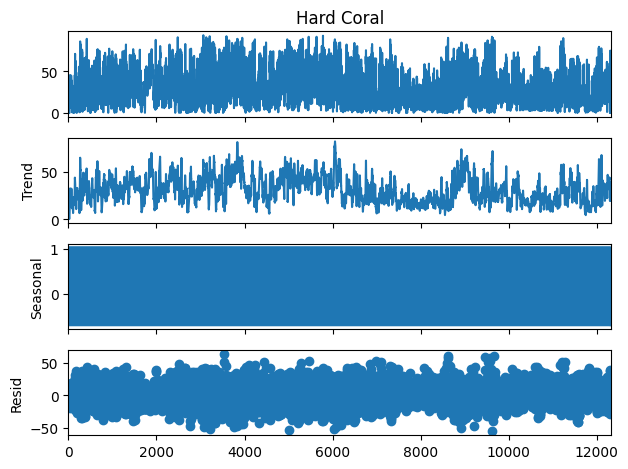

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Load your time series data
result = seasonal_decompose(cleaned_column_target_dataset['Hard Coral'], model='additive', period=12)

# Plot the decomposition
result.plot()
plt.show()

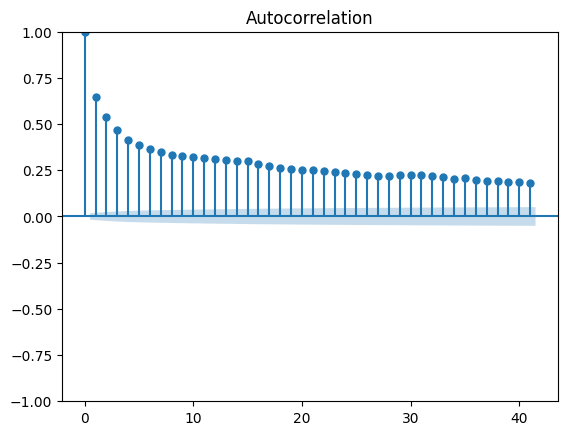

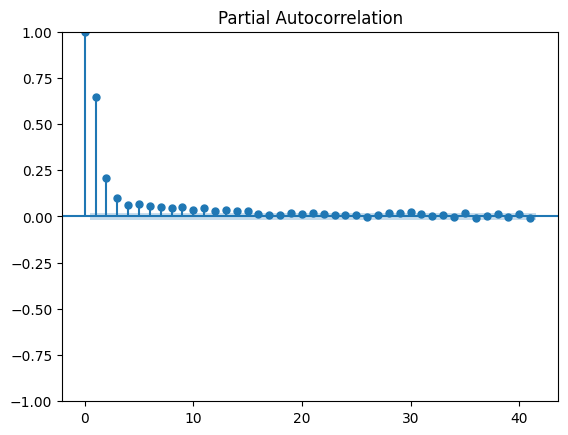

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(cleaned_column_target_dataset['Hard Coral'])
plot_pacf(cleaned_column_target_dataset['Hard Coral'])
plt.show()



In [ ]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(cleaned_column_target_dataset['Hard Coral'])
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')

ADF Statistic: -11.156807412882621
p-value: 2.852430862920428e-20


### Test some modeling for mean Hard Coral over time

Ran Arima Model. Looks like there is some seasonality in Months, might have to run SARIMA Model instead to account for it.

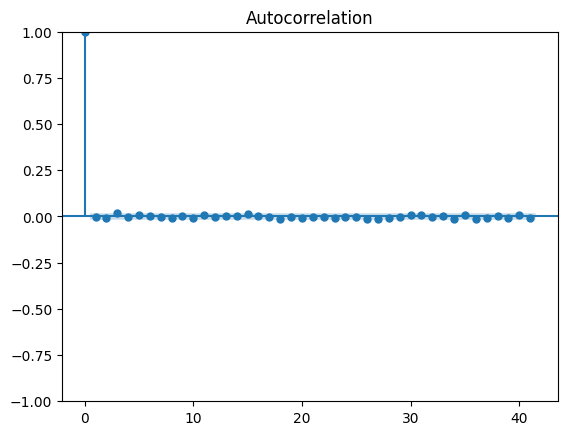

Jarque-Bera p-value: 1.7250625841086448e-214


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Fit ARIMA(3, 0, 1) model as the data is stationary (no differencing needed)
model = ARIMA(cleaned_column_target_dataset['Hard Coral'], order=(3, 0, 1))
fitted_model = model.fit()

# Check residuals for autocorrelation and normality
residuals = fitted_model.resid

# Plot ACF of residuals to check for any remaining autocorrelation
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(residuals)
plt.show()

# Perform a Jarque-Bera test for normality of residuals
from scipy.stats import jarque_bera
jb_stat, jb_pvalue = jarque_bera(residuals)
print(f"Jarque-Bera p-value: {jb_pvalue}")


In [ ]:
# Print the model summary to review parameter estimates
fitted_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             Hard Coral   No. Observations:                12319
Model:                 ARIMA(3, 0, 1)   Log Likelihood              -50401.382
Date:                Wed, 02 Oct 2024   AIC                         100814.765
Time:                        20:55:47   BIC                         100859.278
Sample:                             0   HQIC                        100829.677
                              - 12319                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         31.3150      1.309     23.923      0.000      28.749      33.881
ar.L1          1.3825      0.011    130.746      0.000       1.362       1.403
ar.L2         -0.2917      0.012    -23.832      0.000      -0.316      -0.268
ar.L3         -0.0994      0.008    -11.758      0.000      -0.116      -0.083
ma.L1         -0.9203      0.007   -129.962      0.000      -0.934      -0.906
sigma2       209.5048      2.443     85.740      0.000     204.716     214.294
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):               984.65
Prob(Q):                              0.84   Prob(JB):                         0.00
Heteroskedasticity (H):               0.78   Skew:                             0.29
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Ecoregion EDA

Ecoregion Counts:
 Ecoregion_Name
Sunda Shelf south-east Asia                   1110
Sulu Sea                                       872
Hispaniola Puerto Rico and Lesser Antilles     660
Society Islands French Polynesia               573
South-east Philippines                         440
                                              ... 
Samoa Tuvalu and Tonga                           2
Caroline Islands Micronesia                      2
Ogasawara Islands Japan                          2
North-west Arabian Sea                           1
Houtman Abrolhos Islands west Australia          1
Name: count, Length: 80, dtype: int64

List of Unique Ecoregions:
 ['Houtman Abrolhos Islands west Australia' 'Moreton Bay eastern Australia'
 'Eastern coast South Africa' 'Southern Great Barrier Reef'
 'Austral Islands French Polynesia' 'South Madagascar'
 'Western Tuamotu Archipelago central Pacific' 'New Caledonia'
 'Ningaloo Reef and coastal north-west Australia' 'Mascarene Islands'
 'Central and n

<Figure size 1200x1200 with 0 Axes>

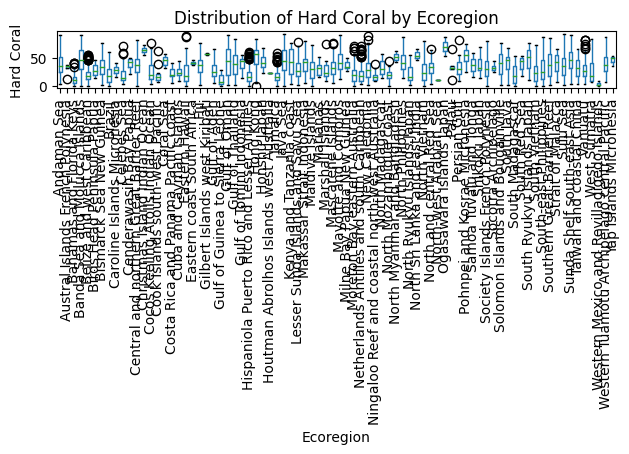

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'cleaned_column_target_dataset' is already loaded
df = cleaned_column_target_dataset

# Step 1: Check how many rows are associated with each ecoregion
ecoregion_counts = df['Ecoregion_Name'].value_counts()

# Step 2: Get a list of all unique ecoregions
unique_ecoregions = df['Ecoregion_Name'].unique()

# Print out the counts and list of unique ecoregions
print("Ecoregion Counts:\n", ecoregion_counts)
print("\nList of Unique Ecoregions:\n", unique_ecoregions)
print("\nNumber of ecoregions:\n", len(unique_ecoregions))

# Step 3: Basic EDA for 'Hard Coral' by 'ecoregion'
# Group by 'ecoregion' and calculate summary statistics for 'Hard Coral'
ecoregion_stats = df.groupby('Ecoregion_Name')['Hard Coral'].describe()

# Step 4: Print out the summary statistics
print("\nSummary Statistics of 'Hard Coral' by Ecoregion:\n", ecoregion_stats)

# Step 5: Plot distribution of 'Hard Coral' across different ecoregions
plt.figure(figsize=(12, 12))
df.boxplot(column='Hard Coral', by='Ecoregion_Name', rot=90, grid=False)
plt.title('Distribution of Hard Coral by Ecoregion')
plt.suptitle('')
plt.xlabel('Ecoregion')
plt.ylabel('Hard Coral')
plt.tight_layout()
plt.show()

In [ ]:
# Save to a text file
with open('ecoregion_counts.txt', 'w') as f:
    f.write(ecoregion_counts.to_string())

print("Ecoregion counts saved to ecoregion_counts.txt")

Ecoregion counts saved to ecoregion_counts.txt


code

In [ ]:
pip install tensorflow pandas scikit-learn numpy


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [ ]:
# Determine the split index
train_size = int(0.8 * len(subset_data))

# Split the data: First 80% for training, Last 20% for testing
train_data = subset_data.iloc[:train_size]
test_data = subset_data.iloc[train_size:]

# Separate features and target for train and test sets
X_train = np.vstack(train_data['full_image_features'].dropna().values)
y_train = train_data['hard_coral_class'].values

X_test = np.vstack(test_data['full_image_features'].dropna().values)
y_test = test_data['hard_coral_class'].values

# If you are also using tabular data, include those features too
X_tabular_train = train_data.drop(['url', 'full_image_features', 'hard_coral_class',
                                   'weighted_image_features', 'cropped_image_features',
                                   'date'], axis=1).values
X_tabular_test = test_data.drop(['url', 'full_image_features', 'hard_coral_class',
                                   'weighted_image_features', 'cropped_image_features',
                                   'date'], axis=1).values

# Combine tabular and image data for training and testing
X_train_combined = np.hstack([X_tabular_train, X_train])
X_test_combined = np.hstack([X_tabular_test, X_test])

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_combined, y_train)
y_pred = rf.predict(X_test_combined)

print(f"Accuracy: {accuracy_score(y_test, y_pred)}")

In [ ]:
feature_importances = rf.feature_importances_
important_features = np.argsort(feature_importances)[::-1][:10]  # Top 10 features
print("Top 10 Important Features:", important_features)

In [ ]:
# Determine the split index
train_size = int(0.8 * len(subset_data))

# Split the data: First 80% for training, Last 20% for testing
train_data = subset_data.iloc[:train_size]
test_data = subset_data.iloc[train_size:]

# Separate features and target for train and test sets
X_train = np.vstack(train_data['weighted_image_features'].dropna().values)
y_train = train_data['hard_coral_class'].values

X_test = np.vstack(test_data['weighted_image_features'].dropna().values)
y_test = test_data['hard_coral_class'].values

# If you are also using tabular data, include those features too
X_tabular_train = train_data.drop(['url', 'full_image_features', 'hard_coral_class',
                                   'weighted_image_features', 'cropped_image_features',
                                   'date'], axis=1).values
X_tabular_test = test_data.drop(['url', 'full_image_features', 'hard_coral_class',
                                   'weighted_image_features', 'cropped_image_features',
                                   'date'], axis=1).values

# Combine tabular and image data for training and testing
X_train_combined = np.hstack([X_tabular_train, X_train])
X_test_combined = np.hstack([X_tabular_test, X_test])

In [ ]:
feature_importances = rf.feature_importances_
important_features = np.argsort(feature_importances)[::-1][:10]  # Top 10 features
print("Top 10 Important Features:", important_features)

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_combined, y_train)
y_pred = rf.predict(X_test_combined)

print(f"Accuracy: {accuracy_score(y_test, y_pred)}")

In [ ]:
# Determine the split index
train_size = int(0.8 * len(subset_data))

# Split the data: First 80% for training, Last 20% for testing
train_data = subset_data.iloc[:train_size]
test_data = subset_data.iloc[train_size:]

# Separate features and target for train and test sets
X_train = np.vstack(train_data['cropped_image_features'].dropna().values)
y_train = train_data['hard_coral_class'].values

X_test = np.vstack(test_data['cropped_image_features'].dropna().values)
y_test = test_data['hard_coral_class'].values

# If you are also using tabular data, include those features too
X_tabular_train = train_data.drop(['url', 'full_image_features', 'hard_coral_class',
                                   'weighted_image_features', 'cropped_image_features',
                                   'date'], axis=1).values
X_tabular_test = test_data.drop(['url', 'full_image_features', 'hard_coral_class',
                                   'weighted_image_features', 'cropped_image_features',
                                   'date'], axis=1).values

# Combine tabular and image data for training and testing
X_train_combined = np.hstack([X_tabular_train, X_train])
X_test_combined = np.hstack([X_tabular_test, X_test])

In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_combined, y_train)
y_pred = rf.predict(X_test_combined)

print(f"Accuracy: {accuracy_score(y_test, y_pred)}")

In [ ]:
feature_importances = rf.feature_importances_
important_features = np.argsort(feature_importances)[::-1][:10]  # Top 10 features
print("Top 10 Important Features:", important_features)